# Final Project (Individual)
# Study of Customer Reviews for Chase Bank and its Competitors to Identify Strengths and Weaknesses of Chase Bank


### Krish Weragalarachchi 

## Section 1: Background
Customer reviews are a very valuable source of information for all companies. Every second, online review sites and social media produce data that can be useful for making insights about any business. Companies can see how their brand, product, or service is being criticized or praised by customers through online conversations. Moreover, this data can be used to improve products and services and tailor them to customer needs. By identifying the competitors in the field and their strengths and weaknesses, a company can improve its own product and services to attract new customers as well. Analyzing customer reviews and social media data to get the above insights and make decisions is especially important in the banking field as well.

Chase Bank is the consumer banking arm of JPMorgan Chase, one of the largest banking companies in the U.S. It started in 1799 and has grown over the years by merging with Bank One Corporation in 2004 and Washington Mutual in 2008. Chase bank has managed to earn accolades for customer satisfaction in previous years and still has a good reputation in the industry. It is helpful for them to identify where they shine and where they could offer more to customers to prevail in the field. 

## Section 2: Business Question
In this project, I am pretending as an analyst working for the Chase Bank which has its headquarters in New York and branches all over the country. "Bank of America '', "Citibank '' and "Wells Fargo" can be identified as some of the major competitors of Chase Bank who have similar branching networks and good reputation. There are several websites that collect customer reviews for banks and financial services and consumeraffairs.com is one of them. Studying customer reviews over the years for Chase bank is a better way to understand its customers, their needs, areas where the improvements should be made, and areas where the customers are satisfied. Moreover, by doing the same analysis for its competitors and comparing them with its own, some great insights can be drawn to attract more customers to Chase Bank. 

Here, customer reviews for Chase Bank over the years were analyzed and compared with those for its competitors "Bank of America", "Citibank" and "Wells Fargo". My goal is to find out what areas that Chase Bank needs to focus on to improve customer satisfaction and what place it holds with these 3 competitors.

In [1]:
## get all the modules needed
import requests # grab sourcecode of webpages
from lxml import html
import csv
import pandas as pd
from datetime import datetime, timedelta
import matplotlib.pyplot as plt
import re
from nltk.sentiment.vader import SentimentIntensityAnalyzer
import numpy as np
from nltk.corpus import stopwords
from nltk import word_tokenize
from nltk.stem import WordNetLemmatizer
from nltk import bigrams

from os import path
from wordcloud import WordCloud, STOPWORDS
import matplotlib.pyplot as plt
from PIL import Image

import gensim
from collections import Counter
from gensim.corpora import Dictionary
from gensim.models import ldamodel

import itertools
import collections

## Section 3: Data Identification and Collection

Customer reviews for Chase bank, Citibank, Bank of America, and Wells Fargo were scraped from www.consumeraffairs.com website and stored in CSV format to use in the project.

Chase Bank reviews : https://www.consumeraffairs.com/finance/chase_bank.html?page=%s

Citibank reviews  : https://www.consumeraffairs.com/finance/citibank.htm?page=%s

Bank of America reviews : https://www.consumeraffairs.com/finance/bofa.html?page=%s

Wells Fargo reviews : https://www.consumeraffairs.com/finance/wells_fargo.html?page=%s

**J. P. Morgan Chase**

3652 reviews including customer screen name, date and their rating for J.P.Morgan Chase bank were scraped from www.consumeraffairs.com 

In [ ]:
# list to store crawled data and reviews
chase_alldata=[] 
chase_reviews=[]

# source page
web='https://www.consumeraffairs.com/finance/chase_bank.html?page=%s'

# loop for crawling multiple pages
for page in range(0,125,1):
    url = web % page
    data = html.fromstring(requests.get(url).text)
    
    for i in data.xpath("//div[contains(@class, 'rvw js-rvw')]"):
        name=i.xpath("div[2]/div/strong[1]/text()")[0]
        date=i.xpath("div[3]/span/text()")[0]
        review = i.xpath("div[3]/p[1]/text()"),i.xpath("div[3]/p[2]/text()"), i.xpath("div[3]/div/p/text()") , i.xpath("div[3]/div/p[2]/text()"),i.xpath("div[3]/div/p[3]/text()")
        ratings= i.xpath("div[1]/div/meta[2]/@content") 
               
        chase_alldata.append([name,date,review,ratings])
        chase_reviews.append([review])
chase_df = pd.DataFrame(chase_alldata)

In [ ]:
# Save dataframe and list to csv
chase_df.to_csv(r'chase.csv', index = False)
with open("chase_reviews.csv", "w", newline="") as f:
    writer = csv.writer(f)
    writer.writerows(chase_reviews)

**Citibank**

 1770 reviews including customer screen name, date and their rating for Citibank were scraped from www.consumeraffairs.com

In [ ]:
# list to store crawled data and reviews
citi_alldata=[] 
citi_reviews=[]

# source page
web='https://www.consumeraffairs.com/finance/citibank.htm?page=%s'

# loop for crawling multiple pages
for page in range(0,62,1):
    url = web % page
    data = html.fromstring(requests.get(url).text)
    
    for i in data.xpath("//div[contains(@class, 'rvw js-rvw')]"):
        name=i.xpath("div[2]/div/strong[1]/text()")[0]
        date=i.xpath("div[3]/span/text()")[0]
        review = i.xpath("div[3]/p[1]/text()"),i.xpath("div[3]/p[2]/text()"), i.xpath("div[3]/div/p/text()") , i.xpath("div[3]/div/p[2]/text()"),i.xpath("div[3]/div/p[3]/text()")
        ratings= i.xpath("div[1]/div/meta[2]/@content") 
               
        citi_alldata.append([name,date,review,ratings])
        citi_reviews.append([review])
citi_df = pd.DataFrame(citi_alldata)

In [ ]:
#Save dataframe and list
citi_df.to_csv(r'citi.csv', index = False)
with open("citi_reviews.csv", "w", newline="") as f:
    writer = csv.writer(f)
    writer.writerows(citi_reviews)

**Bank of America**

4694 reviews including customer screen name, date and their rating for Bank of America were scraped from www.consumeraffairs.com 

In [ ]:
# list to store crawled data and reviews
bofa_alldata=[] 
bofa_reviews=[]

# source page
web='https://www.consumeraffairs.com/finance/bofa.html?page=%s'

# loop for crawling multiple pages
for page in range(0,160,1):
    url = web % page
    data = html.fromstring(requests.get(url).text)
    
    for i in data.xpath("//div[contains(@class, 'rvw js-rvw')]"):
        name=i.xpath("div[2]/div/strong[1]/text()")[0]
        date=i.xpath("div[3]/span/text()")[0]
        review = i.xpath("div[3]/p[1]/text()"),i.xpath("div[3]/p[2]/text()"), i.xpath("div[3]/div/p/text()") , i.xpath("div[3]/div/p[2]/text()"),i.xpath("div[3]/div/p[3]/text()")
        ratings= i.xpath("div[1]/div/meta[2]/@content") 
               
        bofa_alldata.append([name,date,review,ratings])
        bofa_reviews.append([review])
bofa_df = pd.DataFrame(bofa_alldata)

In [ ]:
#Save dataframe and list
bofa_df.to_csv(r'bofa.csv', index = False)
with open("bofa_reviews.csv", "w", newline="") as f:
    writer = csv.writer(f)
    writer.writerows(bofa_reviews)

**Wells Fargo**

3100 reviews including customer screen name, date and their rating for Wells Fargo Bank were scraped from www.consumeraffairs.com 

In [ ]:
# list to store crawled data and reviews
wellsf_alldata=[] 
wellsf_reviews=[]

# source page
web='https://www.consumeraffairs.com/finance/wells_fargo.html?page=%s'

# loop for crawling multiple pages
for page in range(0,106,1):
    url = web % page
    data = html.fromstring(requests.get(url).text)
    
    for i in data.xpath("//div[contains(@class, 'rvw js-rvw')]"):
        name=i.xpath("div[2]/div/strong[1]/text()")[0]
        date=i.xpath("div[3]/span/text()")[0]
        review = i.xpath("div[3]/p[1]/text()"),i.xpath("div[3]/p[2]/text()"), i.xpath("div[3]/div/p/text()") , i.xpath("div[3]/div/p[2]/text()"),i.xpath("div[3]/div/p[3]/text()")
        ratings= i.xpath("div[1]/div/meta[2]/@content") 
               
        wellsf_alldata.append([name,date,review,ratings])
        wellsf_reviews.append([review])
wellsf_df = pd.DataFrame(wellsf_alldata)

In [ ]:
#Save dataframe and list
wellsf_df.to_csv(r'wellsfargo.csv', index = False)
with open("wellsfargo_reviews.csv", "w", newline="") as f:
    writer = csv.writer(f)
    writer.writerows(wellsf_reviews)

## Section 4: Data Understanding









Each dataset contains screen name of customer, his/her city and state, date, review and overall rating.

City and State data are helpful to identify customer profiles. Date information helps to study the rating changes over time and analyzing reviews helps to understand its customer needs, areas where the improvements should be made, and areas where the customers are satisfied.

Moreover, studying Chase bank's major competitors "Bank of America”, "Citi Bank" and "Wells Fargo” helps to identify areas that Chase needs to be improved to attract more customers.

## Section 5: Data Cleaning 

In [2]:
# open saved data csv file
chase=pd.read_csv("chase.csv")
citi=pd.read_csv("citi.csv")
america=pd.read_csv("bofa.csv")
wellsfargo=pd.read_csv("wellsfargo.csv")

The dataframes contain scraped raw data for each bank and they need to be cleaned. Following are the steps the dataframe containing Chase bank data was cleaned.

First the columns were renamed.

In [3]:
# rename columns
df=chase.rename(columns={'0':'screen_name','1':'date','2':'review','3':'overall_rating'})
df.head()

,screen_name,date,review,overall_rating
0,"Jeremy of Las Vegas, NV","Original review: Aug. 14, 2020","([], ['I want Chase to know the amount of valu...",['5']
1,"Jim of Tucson, AZ","Original review: July 30, 2020","([], [""For the past 30 years we were with a la...",['5']
2,"maureen of Pleasanton, CA","Original review: July 27, 2020","([], ['I would like people to know how easy th...",['5']
3,"Heather of Port Richey, FL","Original review: June 17, 2020","([], ['I have been a Chase customer for over 5...",['5']
4,"Gregdrick of Long Beach, CA","Original review: May 7, 2020","(['I came into town in St. Louis Park, Minneso...",['5']


Necessary information were extracted from "screen_name" column and "date" column

In [4]:
# get necessary information from Screen_name and date columns
df['date'] = df['date'].apply(lambda x: x.split(':')[1])

location=[] # list to save location information
for screen_name in df["screen_name"]:
    t=screen_name.split('of')
    if len(t) == 2:
        location.append(t[1])
    else:
        location.append(t[0])
df['location']=location

# delete screen name
df.drop(['screen_name'],axis=1,inplace=True)
df.head()

,date,review,overall_rating,location
0,"Aug. 14, 2020","([], ['I want Chase to know the amount of valu...",['5'],"Las Vegas, NV"
1,"July 30, 2020","([], [""For the past 30 years we were with a la...",['5'],"Tucson, AZ"
2,"July 27, 2020","([], ['I would like people to know how easy th...",['5'],"Pleasanton, CA"
3,"June 17, 2020","([], ['I have been a Chase customer for over 5...",['5'],"Port Richey, FL"
4,"May 7, 2020","(['I came into town in St. Louis Park, Minneso...",['5'],"Long Beach, CA"


"location" column contains city and state data and can be seperated in to 2 columns. 

In [5]:
# get city infomation to a different column:
df['city'] = df['location'].apply(lambda x: x.split(',')[0])
df.head()

,date,review,overall_rating,location,city
0,"Aug. 14, 2020","([], ['I want Chase to know the amount of valu...",['5'],"Las Vegas, NV",Las Vegas
1,"July 30, 2020","([], [""For the past 30 years we were with a la...",['5'],"Tucson, AZ",Tucson
2,"July 27, 2020","([], ['I would like people to know how easy th...",['5'],"Pleasanton, CA",Pleasanton
3,"June 17, 2020","([], ['I have been a Chase customer for over 5...",['5'],"Port Richey, FL",Port Richey
4,"May 7, 2020","(['I came into town in St. Louis Park, Minneso...",['5'],"Long Beach, CA",Long Beach


In [6]:
# get state information: 
# (since some reviewers did not have state listed, have to do it in list comprehension approach)

state = [] # list to append state information
for location in df['location']:

    t=location.split(',')
    if len(t) == 2:
        state.append(t[1])
    else:
        state.append("")
df['state'] = state

# delete location column
df.drop(['location'],axis=1,inplace=True)
df.head()

,date,review,overall_rating,city,state
0,"Aug. 14, 2020","([], ['I want Chase to know the amount of valu...",['5'],Las Vegas,NV
1,"July 30, 2020","([], [""For the past 30 years we were with a la...",['5'],Tucson,AZ
2,"July 27, 2020","([], ['I would like people to know how easy th...",['5'],Pleasanton,CA
3,"June 17, 2020","([], ['I have been a Chase customer for over 5...",['5'],Port Richey,FL
4,"May 7, 2020","(['I came into town in St. Louis Park, Minneso...",['5'],Long Beach,CA


In [7]:
# state column to uppercase
df['state'] = df['state'].apply(lambda x: x.upper())
# replace state names to two letter abbriviations
replace_values={'ALASKA':'AL','ARIZONA':'AZ','ARK':'AK','ARKANSAS':'AK','CA.':'CA','CALIFORNIA':'CA',
                    'CONNECTICUT':'CT','CT.':'CT','FLORIDA':'FL','GEORGIA':'GA','GA GA':'GA',
                    'IDAHO':'ID','ILLINOIS':'IL','KENTUCKY':'KY','KANSAS':'KS','LOUSISANA':'LA',
                   'MICHIGAN':'MI','MINNESOTA':'MN','MARYLAND':'MD','MISSISSIPPI':'MS','MISSOURI':'MO',
                    'MN(MN)':'MN','MONTANA':'MT','NEVADA':'NV','NEW YORK':'NY','NEW JERSEY':'NJ',
                    'NEW MEXICO':'NM','NORTH CAOLINA':'NC','OHIO':'OH','OKLAHOMA':'OK','OREGON':'OR',
                    'OTHERA':'OTHER','PUERTO RICO':'PR','PENNSYLVANIA':'PA','PA.':'PA','SOUTH CAOLINA':'SC',
                    'S.C.':'SC','TENNESSEE':'TN','TN.':'TN','TEXAS':'TX','UTAH':'UT','VA - VIRGINIA':'VA',
                    'VIRGINIA':'VA','WASH.':'WA','WASHINGTON':'WA','US':'OTHER','AB':'OTHER','NSW':'OTHER',
                    'NT':'OTHER','AKS':'AK','12':'OTHER'}
df['state']=df['state'].replace(replace_values, regex=True, inplace=False)
df['state']=df['state'].replace(replace_values, regex=True, inplace=False)

"date" column is object type. In order to convert it in to datetime format, month needs to be in 3 letter format. All the months names were replaced with 3 letters.

In [8]:
# replace month with appropriate format to convert to datetime.
replace_values={'Jan.':'Jan','Feb.':'Feb','March':'Mar','April':'Apr','June':'Jun','July':'Jul','Aug.':'Aug','Sept.':'Sep','Oct.':'Oct','Nov.':'Nov','Dec.':'Dec'}
df['date'].replace(replace_values, regex=True, inplace=True) 
# remove white spaces
df['date']=df['date'].astype(str).str.replace(' ', '')
df.head()

,date,review,overall_rating,city,state
0,"Aug14,2020","([], ['I want Chase to know the amount of valu...",['5'],Las Vegas,NV
1,"Jul30,2020","([], [""For the past 30 years we were with a la...",['5'],Tucson,AZ
2,"Jul27,2020","([], ['I would like people to know how easy th...",['5'],Pleasanton,CA
3,"Jun17,2020","([], ['I have been a Chase customer for over 5...",['5'],Port Richey,FL
4,"May7,2020","(['I came into town in St. Louis Park, Minneso...",['5'],Long Beach,CA


Then the "date" column was changed to datetime type

In [9]:
# convert date to datetime type
df['date'] =  pd.to_datetime(df['date'], format='%b%d,%Y')
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3652 entries, 0 to 3651
Data columns (total 5 columns):
 #   Column          Non-Null Count  Dtype         
---  ------          --------------  -----         
 0   date            3652 non-null   datetime64[ns]
 1   review          3652 non-null   object        
 2   overall_rating  3652 non-null   object        
 3   city            3652 non-null   object        
 4   state           3652 non-null   object        
dtypes: datetime64[ns](1), object(4)
memory usage: 142.8+ KB


Then, "review" and 'overall_rating' columns were cleaned by removing extar brackets, parenthesis, comma etc.

In [10]:
df['review'] = df['review'].astype(str).str.replace('\[|\]', '')
df['review'] = df['review'].str.replace('\(|\)', '') # remove paranthesis
df['review'] = df['review'].str.replace(",", '') # remove comma
df['review'] = df['review'].str.replace("'", '') # remove single quote
df['review'] = df['review'].str.replace("\"", '') # remove double quote r'\\n', ''
df['overall_rating'] = df['overall_rating'].astype(str).str.replace('\[|\]', '')
df['overall_rating'] = df['overall_rating'].str.replace("'", '')
df.head()

,date,review,overall_rating,city,state
0,2020-08-14,I want Chase to know the amount of value that...,5,Las Vegas,NV
1,2020-07-30,For the past 30 years we were with a large Ca...,5,Tucson,AZ
2,2020-07-27,I would like people to know how easy this ban...,5,Pleasanton,CA
3,2020-06-17,I have been a Chase customer for over 5 years...,5,Port Richey,FL
4,2020-05-07,I came into town in St. Louis Park Minnesota a...,5,Long Beach,CA


Finally, all empty values were replaced with NaN

In [11]:
# replace all empty values with NAN
df.replace("", float("NaN"), inplace=True)
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3652 entries, 0 to 3651
Data columns (total 5 columns):
 #   Column          Non-Null Count  Dtype         
---  ------          --------------  -----         
 0   date            3652 non-null   datetime64[ns]
 1   review          3652 non-null   object        
 2   overall_rating  2146 non-null   object        
 3   city            3652 non-null   object        
 4   state           3630 non-null   object        
dtypes: datetime64[ns](1), object(4)
memory usage: 142.8+ KB


Function was created to clean dataframes with above steps to use with data of other banks.

In [12]:
def clean_df(df):
    # rename columns
    df=df.rename(columns={'0':'screen_name','1':'date','2':'review','3':'overall_rating'})
    
    # get necessary information from screen_name and date columns
    df['date'] = df['date'].apply(lambda x: x.split(':')[1])
    location=[]
    for screen_name in df["screen_name"]:
        t=screen_name.split('of')
        if len(t) == 2:
            location.append(t[1])
        else:
            location.append(t[0])
    df['location']=location
    # delete screen name
    df.drop(['screen_name'],axis=1,inplace=True)
    # get city info:
    df['city'] = df['location'].apply(lambda x: x.split(',')[0])
    # get state info:
    state = []
    for location in df['location']:

        t=location.split(',')
        if len(t) == 2:
            state.append(t[1])
        else:
            state.append("")
    df['state'] = state
    # delete location column
    df.drop(['location'],axis=1,inplace=True) 
    # state column to uppercase
    df['state'] = df['state'].apply(lambda x: x.upper())
    # replace State names
    replace_values={'ALASKA':'AL','ARIZONA':'AZ','ARK':'AK','ARKANSAS':'AK','CA.':'CA','CALIFORNIA':'CA',
                    'CONNECTICUT':'CT','CT.':'CT','FLORIDA':'FL','GEORGIA':'GA','GA GA':'GA',
                    'IDAHO':'ID','ILLINOIS':'IL','KENTUCKY':'KY','KANSAS':'KS','LOUSISANA':'LA',
                   'MICHIGAN':'MI','MINNESOTA':'MN','MARYLAND':'MD','MISSISSIPPI':'MS','MISSOURI':'MO',
                    'MN(MN)':'MN','MONTANA':'MT','NEVADA':'NV','NEW YORK':'NY','NEW JERSEY':'NJ',
                    'NEW MEXICO':'NM','NORTH CAOLINA':'NC','OHIO':'OH','OKLAHOMA':'OK','OREGON':'OR',
                    'OTHERA':'OTHER','PUERTO RICO':'PR','PENNSYLVANIA':'PA','PA.':'PA','SOUTH CAOLINA':'SC',
                    'S.C.':'SC','TENNESSEE':'TN','TN.':'TN','TEXAS':'TX','UTAH':'UT','VA - VIRGINIA':'VA',
                    'VIRGINIA':'VA','WASH.':'WA','WASHINGTON':'WA','US':'OTHER','AB':'OTHER','NSW':'OTHER',
                    'NT':'OTHER','AKS':'AK','12':'OTHER'}
    df['state'].replace(replace_values, regex=True, inplace=True)
    df['state'].replace(replace_values, regex=True, inplace=False)
    # replace month with 3 letters inorder to use with datetime 
    replace_values={'Jan.':'Jan','Feb.':'Feb','March':'Mar','April':'Apr','June':'Jun','July':'Jul','Aug.':'Aug','Sept.':'Sep','Oct.':'Oct','Nov.':'Nov','Dec.':'Dec'}
    df['date'].replace(replace_values, regex=True, inplace=True)
    # convert data to string and remove white spaces
    df['date']=df['date'].astype(str).str.replace(' ', '')
    # convert date to datetime
    df['date'] =  pd.to_datetime(df['date'], format='%b%d,%Y')
    # clean review column
    df['review'] = df['review'].astype(str).str.replace('\[|\]', '') # remove brackets
    df['review'] = df['review'].str.replace('\(|\)', '') # remove paranthesis
    df['review'] = df['review'].str.replace(",", '') # remove comma
    df['review'] = df['review'].str.replace("'", '') # remove single quote
    df['review'] = df['review'].str.replace("\"", '') # remove double quote r'\\n', ''
    # clean rating column
    df['overall_rating'] = df['overall_rating'].astype(str).str.replace('\[|\]', '') # remove brackets
    df['overall_rating'] = df['overall_rating'].str.replace("'", '') # remove single quote
    # remove empty entries
    df.replace("", float("NaN"), inplace=True)

    return df

Below are the cleaned dataframes for each bank using the above function clean_df( ). All cleaned data frames were saved in CSV format for future use in Tableu softaware.

In [13]:
# data for chase bank
chase_cleaned=clean_df(chase)
# save as csv to use in Tableau
chase_cleaned.to_csv('chase_cleaned.csv')
chase_cleaned.head()

,date,review,overall_rating,city,state
0,2020-08-14,I want Chase to know the amount of value that...,5,Las Vegas,NV
1,2020-07-30,For the past 30 years we were with a large Ca...,5,Tucson,AZ
2,2020-07-27,I would like people to know how easy this ban...,5,Pleasanton,CA
3,2020-06-17,I have been a Chase customer for over 5 years...,5,Port Richey,FL
4,2020-05-07,I came into town in St. Louis Park Minnesota a...,5,Long Beach,CA


In [14]:
# data for citi bank
citi_cleaned=clean_df(citi)
#save as csv to use in Tableau
citi_cleaned.to_csv('citi_cleaned.csv')
citi_cleaned.head()

,date,review,overall_rating,city,state
0,2020-08-08,Citibank is a long-standing bank. It has alwa...,4,Staten Island,NY
1,2020-08-03,I have my accounts with Citibank for over 18 ...,4,New Brunswick,NJ
2,2020-07-30,I like that Citibank has 24/7 customer servic...,4,Passaic,NJ
3,2019-11-24,I’m in a financial struggle at the moment and...,5,Rochester,NY
4,2019-11-23,About 2 weeks ago I was at the Westwood branc...,5,Los Angeles,CA


In [15]:
# data for Bank of America
bof_cleaned=clean_df(america)
# save as csv to use in Tableau
bof_cleaned.to_csv('bof_cleaned.csv')
bof_cleaned.head()

,date,review,overall_rating,city,state
0,2020-08-08,I had many different types of accounts with t...,4,Seattle,WA
1,2020-08-07,I have banked with Bank of America BoA ever s...,5,Spring,TX
2,2020-08-03,My only problem with Bank of America is they ...,4,Gainesville,FL
3,2020-07-27,Reps are always courteous knowledgeable and p...,5,Rosenberg,TX
4,2020-06-14,I had an issue while opening an Online Checki...,5,Augusta,GA


In [16]:
# data for Wellsfargo bank
wf_cleaned=clean_df(wellsfargo)
# save as csv to use in Tableau
wf_cleaned.to_csv('wf_cleaned.csv')
wf_cleaned.head()

,date,review,overall_rating,city,state
0,2020-08-06,Wells Fargo inherited the banks I used. When ...,4,Royersford,PA
1,2020-07-31,I recently had to make a wire transfer for th...,5,Henderson,NV
2,2020-07-30,Ive been with Wells Fargo since it came to At...,4,Atlanta,GA
3,2020-07-29,I like this bank but last week I needed a sta...,4,Saint Petersburg,FL
4,2020-07-28,I have been with Wells Fargo since I was 15 y...,5,Key West,FL


## Section 6: Descriptive Data Analysis

### 6:1 Rating

The first step is to identify changes in ratings over time. This helps to understand if there is a sudden drop or gain in ratings. The following is for the Chase bank.

In [17]:
# get date and ratings to a different dataframe
chase_rating=chase_cleaned[["date", "overall_rating"]]
# drop entries with no ratings
chase_rating=chase_rating.dropna()
# change type of "overall_rating" from object to numeric
chase_rating["overall_rating"]=pd.to_numeric(chase_rating.overall_rating, errors='coerce')
chase_rating.head()

,date,overall_rating
0,2020-08-14,5
1,2020-07-30,5
2,2020-07-27,5
3,2020-06-17,5
4,2020-05-07,5


In order to handle each bank, a function was created to output a dataframe with just dates and non-empty overall_ratings as above.

In [18]:
def DateRating(df):
    # get date and ratings to a different dataframe
    newdf=df[["date", "overall_rating"]]
    # drop entries with no ratings
    newdf=newdf.dropna()
    # change type of "overall_rating" from object to numeric
    newdf["overall_rating"]=pd.to_numeric(newdf.overall_rating, errors='coerce')
    return newdf

Let's get number of ratings for each catogory for each bank using DateRating( ) function

In [19]:
# dataframe with just dates and non-empty overall_ratings for chase bank
pie_chase=DateRating(chase_cleaned).groupby('overall_rating').count().reset_index()
# change date column to "count" to be dataframe to be meaningful
pie_chase=pie_chase.rename(columns={'date':'count'})
# same for other banks
pie_citi=DateRating(citi_cleaned).groupby('overall_rating').count().reset_index()
pie_citi=pie_citi.rename(columns={'date':'count'})
pie_bof=DateRating(bof_cleaned).groupby('overall_rating').count().reset_index()
pie_bof=pie_bof.rename(columns={'date':'count'})
pie_wf=DateRating(wf_cleaned).groupby('overall_rating').count().reset_index()
pie_wf=pie_wf.rename(columns={'date':'count'})

rating_counts_all=pie_chase.merge(pie_citi,on='overall_rating')
rating_counts_all=rating_counts_all.rename(columns={'count_x':'Chase','count_y':'Citi'})
rating_counts_all=rating_counts_all.merge(pie_bof,on='overall_rating').merge(pie_wf,on='overall_rating')
rating_counts_all=rating_counts_all.rename(columns={'count_x':'Bank of America','count_y':'Wellsfargo'})
rating_counts_all             

,overall_rating,Chase,Citi,Bank of America,Wellsfargo
0,1,1877,1224,2496,2252
1,2,88,40,133,169
2,3,30,7,75,61
3,4,37,10,54,63
4,5,114,33,140,131


In [20]:
# percentage of ratings
rating_counts_all =rating_counts_all.set_index('overall_rating')
rating_counts_percent= rating_counts_all.div(rating_counts_all.sum(axis=0), axis=1).mul(100).round(2)
rating_counts_percent.reset_index()

,overall_rating,Chase,Citi,Bank of America,Wellsfargo
0,1,87.47,93.15,86.13,84.16
1,2,4.10,3.04,4.59,6.32
2,3,1.40,0.53,2.59,2.28
3,4,1.72,0.76,1.86,2.35
4,5,5.31,2.51,4.83,4.90


Then, the information was displayed in donut plots for each bank.

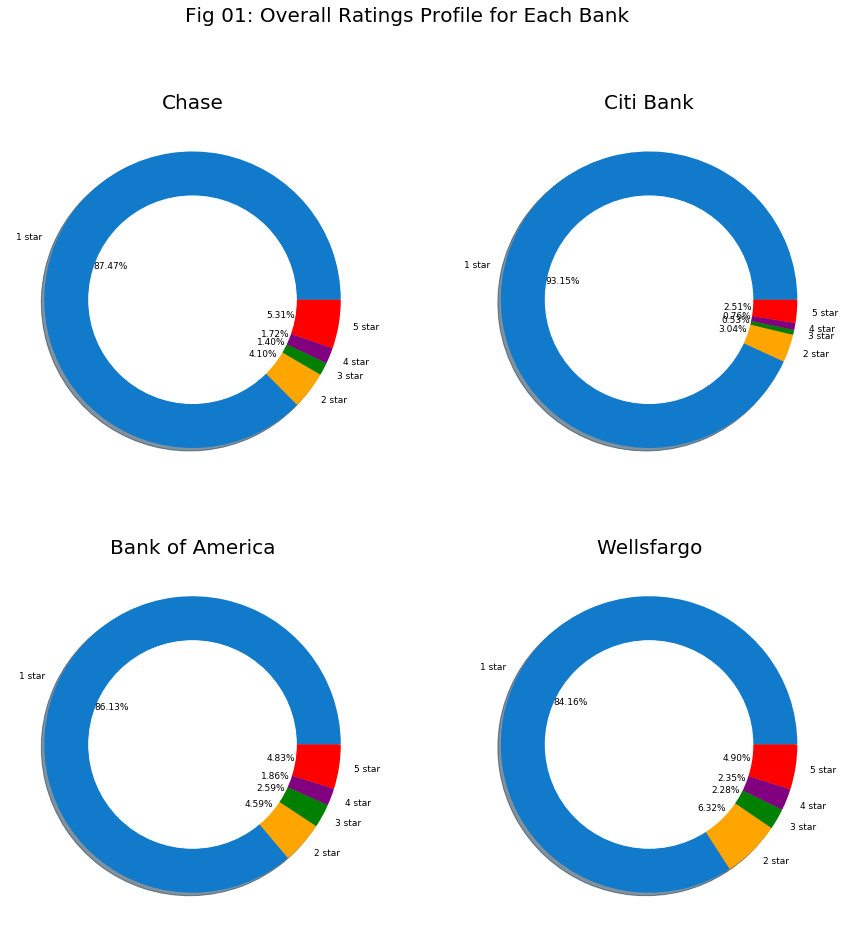

In [21]:
# colors for the plots
colors = ['#117ACA', 'orange','green','purple','red']
# labeling catogories for the plot
labels = ['1 star', '2 star','3 star','4 star','5 star']

plt.rcParams.update({'font.size':9})
fig = plt.figure(figsize=(15,15))
fig.suptitle('Fig 01: Overall Ratings Profile for Each Bank', fontsize=20)    

# chase donut plot
ax1 = plt.subplot2grid((2,2),(0,0))
plt.pie(pie_chase['count'],autopct='%1.2f%%',shadow=True, radius=1,colors=colors, labels=labels)
plt.title('Chase',fontsize=20)
p=plt.gcf()
my_circle=plt.Circle( (0,0), 0.7, color='white')
p.gca().add_artist(my_circle)

# citi donut plot
ax1 = plt.subplot2grid((2,2), (0, 1))
plt.pie(pie_citi['count'],autopct='%1.2f%%',shadow=True, radius=1,colors=colors, labels=labels)
plt.title('Citi Bank',fontsize=20)
p=plt.gcf()
my_circle=plt.Circle( (0,0), 0.7, color='white')
p.gca().add_artist(my_circle)

# bank of america donut plot
ax1 = plt.subplot2grid((2,2), (1, 0))
plt.pie(pie_bof['count'],autopct='%1.2f%%',shadow=True, radius=1,colors=colors, labels=labels)
plt.title('Bank of America',fontsize=20)
p=plt.gcf()
my_circle=plt.Circle( (0,0), 0.7, color='white')
p.gca().add_artist(my_circle)

# Wellsfargo donut plot
ax1 = plt.subplot2grid((2,2), (1, 1))
plt.pie(pie_wf['count'],autopct='%1.2f%%',shadow=True, radius=1,colors=colors, labels=labels)
plt.title('Wellsfargo',fontsize=20)
p=plt.gcf()
my_circle=plt.Circle( (0,0), 0.7, color='white')
p.gca().add_artist(my_circle)

Chase bank has the most 5-star percentage rating(5.31%) compared to Bank of America, Wells Fargo, and Citibank. However, 2,3 and 4-star percentage ratings for Chase are lower and 1-star rating is higher compared to Bank of America and Wells Fargo indicating that they both are the main competitors of Chase bank. 

### 6:2 Time series analysis of ratings

It is really important to undersatnd rating changes over time.

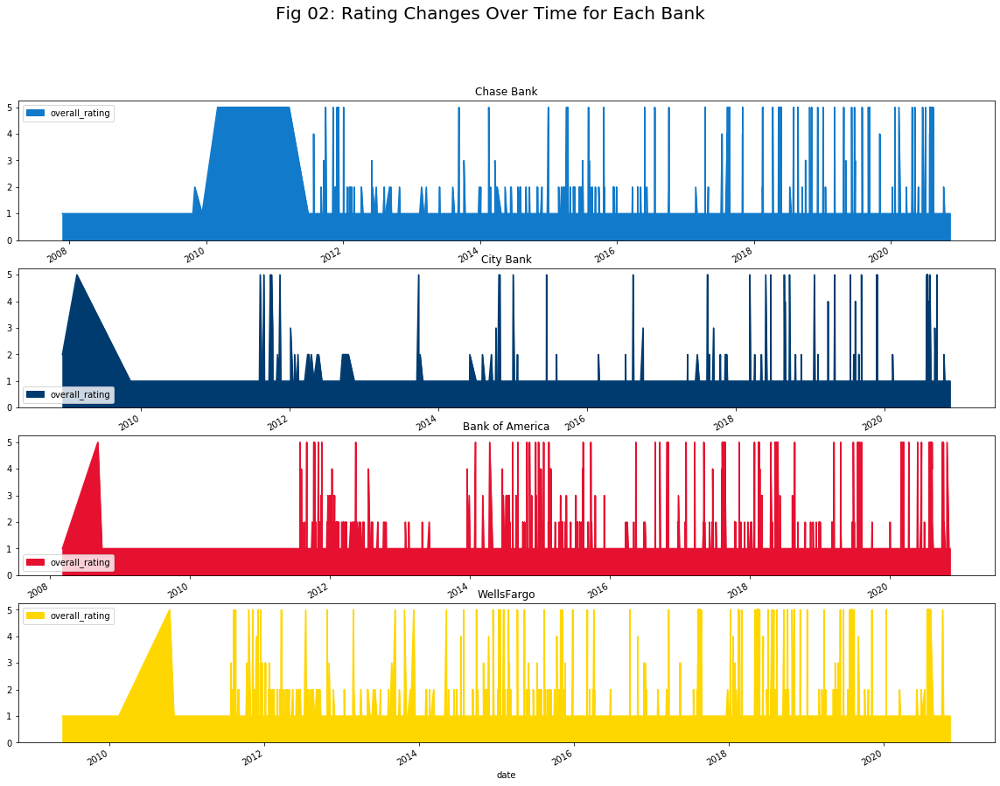

In [22]:
# rating vs date was ploted for each bank. 
plt.rcParams.update({'font.size':10})
fig1,axes=plt.subplots(4,1)
fig1.suptitle('Fig 02: Rating Changes Over Time for Each Bank', fontsize=20)    

g1=DateRating(chase_cleaned).plot(kind='area', x='date', y="overall_rating",color='#117ACA',figsize=(20,15),title='Chase Bank',ax=axes[0])
g2=DateRating(citi_cleaned).plot(kind='area', x='date', y="overall_rating",color='#003B70',figsize=(20,15),title='City Bank',ax=axes[1])
g3=DateRating(bof_cleaned).plot(kind='area', x='date', y="overall_rating",color='#E61030',figsize=(20,15),title='Bank of America',ax=axes[2])
g4=DateRating(wf_cleaned).plot(kind='area', x='date', y="overall_rating",color='gold',figsize=(20,15),title='WellsFargo',ax=axes[3])

Time-series analysis shows that the Chase Bank gained its most 5-star ratings during the period of 2010 - 2011. During that time Citibank and Bank of America were less popular and Chase Bank's competitor was Wells Fargo. It seems that the Bank of America has started to gain popularity after 2014.

### 6:3 Yearly mean rating

It is hard to get a clear insight from graphs of rating vs time (plotted above). Therefore yearly mean rating was calculated.

The following is for Chase bank and then a function was developed to create the same result for other banks.

In [23]:
# get dataframe with dates and non-empty overall_ratings using DateRating function
chase_rating=DateRating(chase_cleaned)
# set index to "date"
chase_rating.set_index(chase_rating['date'], drop=True, inplace=True) 
# create a new column containing year
chase_rating['year'] = chase_rating['date'].apply(lambda x: x.year)
# groupby year and overall_rating to get count and reset index 
chase_rating=chase_rating.groupby(['year','overall_rating']).count().reset_index()
# make new column
chase_rating['rating_sum']=chase_rating['overall_rating']*chase_rating['date']
# group by count (in date column) by year and save in new dataframe
chase_meandf=chase_rating.groupby('year')[['date']].sum()
# group by total rating sum (in rating_sum column) by year and add to previous dataframe
chase_meandf['mean_rating']=chase_rating.groupby('year')[['rating_sum']].sum()
# calculate mean_rating per year
chase_meandf['mean_rating']= chase_meandf['mean_rating']/chase_meandf['date']
# drop date column
chase_meandf.drop(['date'],axis=1,inplace=True)
# set index to numeric
chase_meandf

,mean_rating
year,
2007,1.000000
2009,1.250000
2010,5.000000
2011,1.336538
2012,1.158730
2013,1.151899
2014,1.185897
2015,1.137821
2016,1.068548


Let's create a funtion to output above dataframe of year and mean yearly rating.

In [24]:
def MeanRating(df):

    # get dataframe with dates and non-empty overall_ratings using DateRating function
    newdf=DateRating(df)
    # set index to "date"
    newdf.set_index(newdf['date'], drop=True, inplace=True) 
    # create a new column containing year
    newdf['year'] =  newdf['date'].apply(lambda x: x.year)
    # groupby year and overall_rating to get count and reset index 
    newdf= newdf.groupby(['year','overall_rating']).count().reset_index()
    # make new column
    newdf['rating_sum']= newdf['overall_rating']* newdf['date']
    # group by count (in date column) by year and save in new dataframe
    meandf=newdf.groupby('year')[['date']].sum()
    # group by total rating sum (in rating_sum column) by year and add to previous dataframe
    meandf['mean_rating']= newdf.groupby('year')[['rating_sum']].sum()
    # calculate mean_rating per year
    meandf['mean_rating']= meandf['mean_rating']/meandf['date']
    # drop date column
    meandf.drop(['date'],axis=1,inplace=True)
    return meandf

In [25]:
# create dataframe of year and mean yearly rating for each bank
chase_meandf=MeanRating(chase_cleaned)
citi_meandf=MeanRating(citi_cleaned)
bof_meandf=MeanRating(bof_cleaned)
wf_meandf=MeanRating(wf_cleaned)

In [26]:
# merge all banks to one dataframe
final=chase_meandf.merge(citi_meandf,on='year')
final=final.rename(columns={'mean_rating_x':'Chase','mean_rating_y':'Citi'})
final=final.merge(bof_meandf,on='year').merge(wf_meandf,on='year')
final=final.rename(columns={'mean_rating_x':'Bank of America','mean_rating_y':'Wellsfargo'})
final             

,Chase,Citi,Bank of America,Wellsfargo
year,,,,
2009,1.250000,3.000000,1.000000,1.000000
2010,5.000000,1.000000,1.000000,2.333333
2011,1.336538,1.471698,1.242105,1.348485
2012,1.158730,1.224138,1.219731,1.273543
2013,1.151899,1.187500,1.089109,1.267857
2014,1.185897,1.216667,1.300000,1.194093
2015,1.137821,1.080882,1.139434,1.190476
2016,1.068548,1.052980,1.106618,1.081433
2017,1.593985,1.134454,1.720126,1.659306


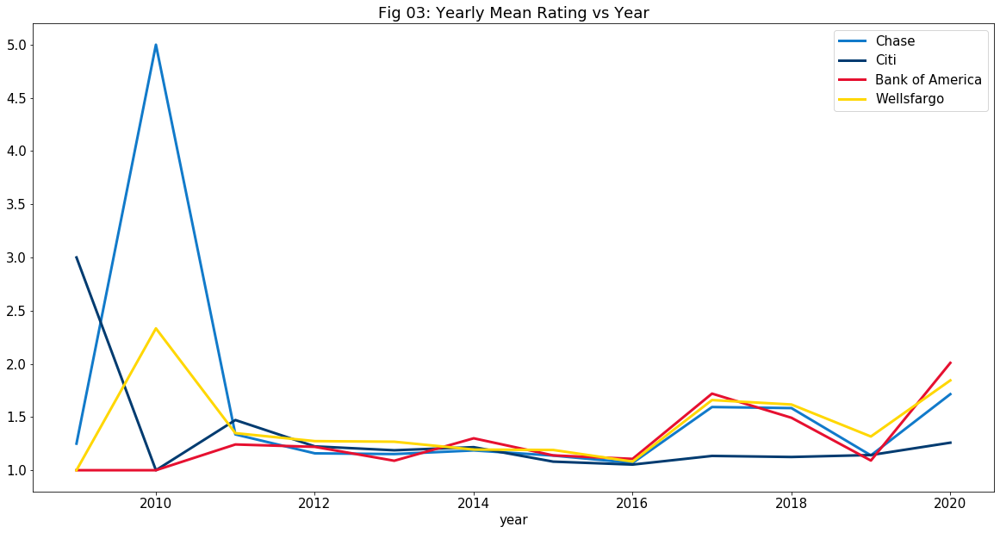

In [27]:
plt.rcParams.update({'font.size':15})

final.plot(stacked=False,figsize=(20,10),
           color=['#117ACA','#003B70','#E61030','gold'],
           linewidth=3.0,
           title='Fig 03: Yearly Mean Rating vs Year')

According to mean yearly ratings Chase bank had a high reputation in 2010 and after a series of fluctuations it maintains its yearly mean rating at 1.71 in 2020. Both, Bank of America and Wells Fargo have higher yearly mean ratings compared to Chase bank in 2020, and Bank of America has the highest. Bank of America had the lowest yearly mean rating in 2010 and it seems gaining up popularity over the years.

## Section 7: Sentiment analysis (Content analytics)

I have used a rule based sentiment analyzer VaderSentiment analyzer which uses a list of lexical features which are labeled as positive or negative according to their semantic orientation to calculate the text sentiment. 

It is not recommended to tokenize and remove stopwords and short words when using the vaderSentiment package. Therefore, I have used raw data after removing non-alphabetic words & characters for sentiment analysis.

Following shows how to update the chase bank dataframe with VaderSentiment compound score and sentiment.

In [28]:
chase_sentiment=chase_cleaned
# change to lowercase
chase_sentiment['review']=chase_sentiment.review.str.lower()
# removing non-alphabetic words & characters
chase_sentiment['review']=chase_sentiment.review.str.replace('[^a-zA-Z]+', ' ')
# initi
analyzer = SentimentIntensityAnalyzer()
# calculate compound score 
chase_sentiment['VSscore'] = chase_sentiment.review.astype(str).apply(lambda x: analyzer.polarity_scores(x)['compound'])
chase_sentiment.head(5)

,date,review,overall_rating,city,state,VSscore
0,2020-08-14,i want chase to know the amount of value that...,5,Las Vegas,NV,0.9437
1,2020-07-30,for the past years we were with a large canad...,5,Tucson,AZ,0.7845
2,2020-07-27,i would like people to know how easy this ban...,5,Pleasanton,CA,-0.5399
3,2020-06-17,i have been a chase customer for over years a...,5,Port Richey,FL,0.9901
4,2020-05-07,i came into town in st louis park minnesota an...,5,Long Beach,CA,0.2484


In [29]:
list1=[] # empty list to append sentiments
for i in chase_sentiment['VSscore']:
    if i > 0:
        list1.append('positive')
    elif i == 0:
        list1.append('neutral')
    else:
        list1.append('negative')
# add sentiment list as a column to original dataframe
chase_sentiment['sentiment']=list1
chase_sentiment.head()

,date,review,overall_rating,city,state,VSscore,sentiment
0,2020-08-14,i want chase to know the amount of value that...,5,Las Vegas,NV,0.9437,positive
1,2020-07-30,for the past years we were with a large canad...,5,Tucson,AZ,0.7845,positive
2,2020-07-27,i would like people to know how easy this ban...,5,Pleasanton,CA,-0.5399,negative
3,2020-06-17,i have been a chase customer for over years a...,5,Port Richey,FL,0.9901,positive
4,2020-05-07,i came into town in st louis park minnesota an...,5,Long Beach,CA,0.2484,positive


Next, the sentiment counts were taken.

In [30]:
# get sentiment count
cut = pd.cut(chase_sentiment.VSscore,[-np.inf, -0.0001, 0.0001, np.inf],labels=['positive', 'neutral', 'negative'])
chase_sent=chase_sentiment.groupby(cut).VSscore.count().reset_index(name='count')
chase_sent

,VSscore,count
0,positive,2261
1,neutral,71
2,negative,1320


Then, 2 funtions were created to output the same for other bank dataframes.  

   1. VSscore( ) function gets the compound score and sentiment for each review.

   2. SentCount( ) function gets positive neutral and negative sentiment count.

In [31]:
def VSscore(dataframe):
    df=dataframe
    df['review']=df.review.str.lower()
    # removing non-alphabetic words & characters
    df['review']=df.review.str.replace('[^a-zA-Z]+', ' ')
    #
    analyzer = SentimentIntensityAnalyzer()
    # calculate compound score 
    df['VSscore'] = df.review.astype(str).apply(lambda x: analyzer.polarity_scores(x)['compound'])
    list1=[] # empty list to append sentiments
    for i in df['VSscore']:
        if i > 0:
            list1.append('positive')
        elif i == 0:
            list1.append('neutral')
        else:
            list1.append('negative')
    # add sentiment list as a column to original dataframe
    df['sentiment']=list1
    return df

In [32]:
def SentCount(df):
    cut = pd.cut(df.VSscore,[-np.inf, -0.0001, 0.0001, np.inf],labels=['positive', 'neutral', 'negative'])
    sentdf=df.groupby(cut).VSscore.count().reset_index(name='count')
    return sentdf

VSscore( )  function was used with all banks to get compound score and sentiment for each review.

In [33]:
# compound score and sentiment for each review for different banks
chase_VS=VSscore(chase_cleaned)
citi_VS=VSscore(citi_cleaned)
bof_VS=VSscore(bof_cleaned)
wf_VS=VSscore(wf_cleaned)

Next, SentCount( ) function was used to output positive neutral and negative count.

In [34]:
# positive neutral and negative count for each bank
chase_sent=SentCount(chase_VS)
citi_sent=SentCount(citi_VS)
bof_sent=SentCount(bof_VS)
wf_sent=SentCount(wf_VS)

All sentiment scores were merged together.

In [35]:
# merge chase_sent and city_sent dataframes
allsent=chase_sent.merge(citi_sent,on='VSscore')
# change column names to be meaningful
allsent=allsent.rename(columns={'count_x':'Chase Bank','count_y':'Citi Bank'})
# merge bof_sent and wf_sent to above dataframe
allsent=allsent.merge(bof_sent,on='VSscore').merge(wf_sent,on='VSscore')
# change column names to be meaningful
allsent=allsent.rename(columns={'count_x':'Bank of America','count_y':'Wellsfargo','VSscore':'Sentiment'})
allsent


,Sentiment,Chase Bank,Citi Bank,Bank of America,Wellsfargo
0,positive,2261,1007,3012,1664
1,neutral,71,20,53,21
2,negative,1320,743,1629,1415


As the review counts for each bank is different, percentage was counted for better comaparison.

In [36]:
# Percentage as whole
allsent =allsent.set_index('Sentiment')
percent= allsent.div(allsent.sum(axis=0), axis=1).mul(100).round(2)
percent.reset_index()

,Sentiment,Chase Bank,Citi Bank,Bank of America,Wellsfargo
0,positive,61.91,56.89,64.17,53.68
1,neutral,1.94,1.13,1.13,0.68
2,negative,36.14,41.98,34.70,45.65


Visualize the percenatge of sentiments for different banks in horizontal bar plot.

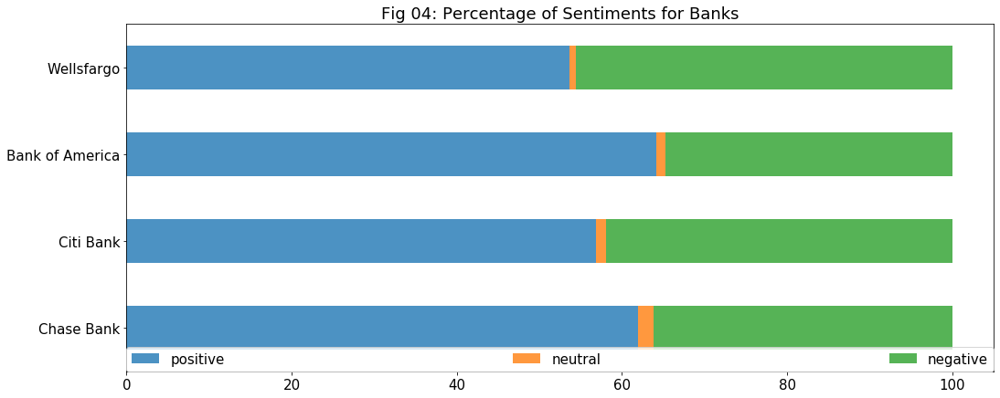

In [37]:
# barplot for sentiment count for banks
ax1=percent.T.plot.barh(stacked=True,figsize=(17,7),alpha=0.8,title = 'Fig 04: Percentage of Sentiments for Banks')
ax1.legend(bbox_to_anchor=(0., 0., 1., .102), loc='lower left',ncol=3, mode="expand", borderaxespad=0.)

Bank of America has the highest percentage of positive reviews (64.17%). The second highest is for Chase bank which is 61.91%.  Bank of America has the lowest percentage of negative reviews(34.7%) and like above Chase Bank comes next with 36.14%. The neutral review percentage for Chase bank is higher than that of Bank of America.

To get an insight about where does the most reviews come from, the data was group by state and sentiment and get the count. Then, the counts were ordered in descending order.

In [38]:
# get chase bank top 10 review count by state and sentiment
a=chase_VS.groupby(['state','sentiment'])[['review']].count().sort_values(ascending=False,by='review').head(10)
# calculate percentage
aa=a.div(len(chase_cleaned), axis=1).mul(100).round(2)
# same for other 3 banks
b=citi_VS.groupby(['state','sentiment'])[['review']].count().sort_values(ascending=False,by='review').head(10)
bb=b.div(len(citi_cleaned), axis=1).mul(100).round(2)
c=bof_VS.groupby(['state','sentiment'])[['review']].count().sort_values(ascending=False,by='review').head(10)
cc=c.div(len(bof_cleaned), axis=1).mul(100).round(2)
d=wf_VS.groupby(['state','sentiment'])[['review']].count().sort_values(ascending=False,by='review').head(10)
dd=d.div(len(wf_cleaned), axis=1).mul(100).round(2)
# merge all of them 
top10_countbystate=aa.merge(bb,on=['state','sentiment'],how='outer').merge(cc,on=['state','sentiment'],how='outer')
top10_countbystate=top10_countbystate.rename(columns={'review_x':'Chase Bank','review_y':'Citi Bank','review':'Bank of America'})
top10_countbystate=top10_countbystate.merge(dd,on=['state','sentiment'],how='outer')
top10_countbystate=top10_countbystate.rename(columns={'review':'WellsFargo'})
top10_countbystate

Chase Bank  Citi Bank  Bank of America  WellsFargo
state  sentiment                                                    
 CA    negative        14.68      12.20            11.33       10.10
       positive         8.46       8.87             6.14        8.58
 NY    negative         6.87       7.46             4.03         NaN
 TX    negative         5.42       3.79             4.86        3.90
 FL    negative         5.18       4.18             7.56        6.10
 IL    negative         4.00        NaN              NaN         NaN
 TX    positive         3.34       2.60             2.85        3.42
 NY    positive         2.93       4.01              NaN         NaN
 FL    positive         2.82       3.28             4.30        4.58
 AZ    negative         2.30        NaN              NaN         NaN
 OTHER negative          NaN       4.29              NaN         NaN
       positive          NaN       2.03              NaN         NaN
 GA    negative          NaN        NaN             4.09        2.97
 NJ    negative          NaN        NaN             2.92        2.42
 NC    negative          NaN        NaN             2.45        2.52
 NJ    positive          NaN        NaN              NaN        2.03

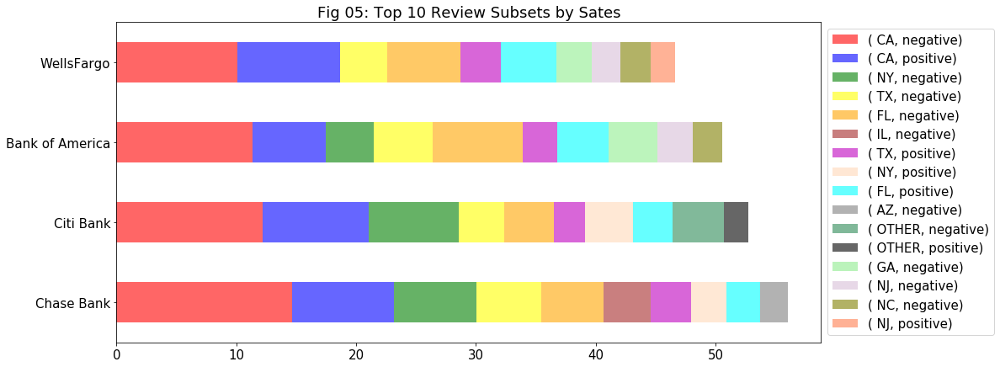

In [39]:
colors=['red','blue','green','yellow','orange','brown','m','peachpuff','aqua','gray','seagreen','black','lightgreen','thistle','olive','coral']
ax2=top10_countbystate.T.plot.barh(stacked=True,figsize=(15,7),alpha=0.6,title = 'Fig 05: Top 10 Review Subsets by Sates',color=colors)
ax2.legend(bbox_to_anchor=(1,1))

This shows that CA produces the highest number of negative reviews for all the banks and the highest is for the Chase Bank. For Chase Bank, Citibank and Wells Fargo highest number of positive reviews comes from CA whereas, for Bank of America it comes from Florida. 

## Section 8. Descriptive Text Analytics

Positive and negative reviews for each bank were extracted to different lists

In [40]:
# positive reviews for chase to a list
chase_pos_list=list((chase_VS.loc[chase_VS['sentiment']=='positive'])['review'])
# negative reviews for chase to a list
chase_neg_list=list((chase_VS.loc[chase_VS['sentiment']=='negative'])['review'])

# positive reviews for citi bank to a list
citi_pos_list=list((citi_VS.loc[citi_VS['sentiment']=='positive'])['review'])
# negative reviews for citi bank to a list
citi_neg_list=list((citi_VS.loc[citi_VS['sentiment']=='negative'])['review'])

# positive reviews for Bank of America to a list
bof_pos_list=list((bof_VS.loc[bof_VS['sentiment']=='positive'])['review'])
# negative reviews for Bank of America
bof_neg_list=list((bof_VS.loc[bof_VS['sentiment']=='negative'])['review'])

# positive reviews for WellsFargo to a list
wf_pos_list=list((wf_VS.loc[wf_VS['sentiment']=='positive'])['review'])
# negative reviews for WellsFargo to a list
wf_neg_list=list((wf_VS.loc[wf_VS['sentiment']=='negative'])['review'])

The following function 'CleanTxt' takes the created list of reviews above and clean, tokenize, make bigrams, remove stopwords, remove corpus specific common words, lemmatize and remove short words.

In [41]:
def CleanTxt(documentslist):
    
    # Remove useless numbers and alphanumerical words
    documents = [re.sub(r"(@[A-Za-z0-9]+)|([^0-9A-Za-z \t])|(\w+:\/\/\S+)|\d+","",text) for text in documentslist]
    # tokenize & lowercase
    texts = [[word for word in text.lower().split() ] for text in documents]
    stoplist = stopwords.words('english')
    stoplist.extend(['day','called','chase','bank','another','want','even','tell','give','call','called','back',
                      'wamu','asked','told','said','one','went','still','never','got','going','year','month','need',
                    'citi','citibank','way','make','say','made','america','wells','fargo','bofa','boa','sent','take',
                    'week','would','could','get','also','like','too','since','dont','also','two','put','first','wachovia',
                    'washington','use','didnt','every','thing','husband','lindsay','see','know','mother','son','daughter','wife'])
    # Remove stopwords
    texts = [[word for word in text if word not in stoplist] for text in texts]
    # Build the bigram model
    bigram = gensim.models.Phrases(texts, min_count=5, threshold=50) # higher threshold fewer phrases. 
    bigram_mod = gensim.models.phrases.Phraser(bigram)
    texts = [bigram_mod[doc] for doc in texts]
    # lemmatizing words
    lmtzr = WordNetLemmatizer()
    texts = [[lmtzr.lemmatize(word) for word in text ] for text in texts]
    # remove stopwords after lemmatizing
    texts = [[word for word in text if word not in stoplist] for text in texts]
    # remove short words
    texts =[[word for word in tokens if len(word) >=3] for tokens in texts]
    
    return texts

"WordC" function gets the cleaned text from 'CleanTxt' function and remove extra brackets in the list, then generate a wordcloud object of 30 words for a given mask and color.

In [42]:
def WordC(texts,mask,color):
    # remove extra brackets 
    lemmatized_reviews = [x for y in texts for x in y]
    cloud_string = str(', '.join(lemmatized_reviews))
    # Generate a word cloud image
    wordcloud = WordCloud(background_color="white",max_words=30,mask=mask,contour_width=5, 
                          contour_color=color,color_func=lambda *args, **kwargs: color,min_font_size=5).generate(cloud_string)
    return wordcloud

### 8.1 Wordclouds for negative and positive reviews 

Wordcloud objects were generated for negative reviews and positive reviews for each bank separately using the above two functions "CleanTxt" and "WordC". Positive reviews are shown in thumbs-up image mask and negative reviews are shown in thumbs-down image mask.

In [43]:
# image for positive word clouds 
# downloaded from https://toppng.com
thumbsup_mask = np.array(Image.open("toppng.com-thumbs-up-silhouette-559x720.png")) 
# image for negative word clouds
# downloaded from https://www.clipartmax.com/
thumbsdown_mask = np.array(Image.open("clipart2428279.png")) 
# generate wordcloud object for positive and negative reviews for each bank
chase_wcp=WordC(CleanTxt(chase_pos_list),thumbsup_mask,'#117ACA')
chase_wcn=WordC(CleanTxt(chase_neg_list),thumbsdown_mask,'#117ACA')
citi_wcp=WordC(CleanTxt(citi_pos_list),thumbsup_mask,'#003B70')
citi_wcn=WordC(CleanTxt(citi_neg_list),thumbsdown_mask,'#003B70')
bof_wcp=WordC(CleanTxt(bof_pos_list),thumbsup_mask,'#E61030')
bof_wcn=WordC(CleanTxt(bof_neg_list),thumbsdown_mask,'#E61030')
wf_wcp=WordC(CleanTxt(wf_pos_list),thumbsup_mask,'gold')
wf_wcn=WordC(CleanTxt(wf_neg_list),thumbsdown_mask,'gold')

(-0.5, 885.5, 979.5, -0.5)

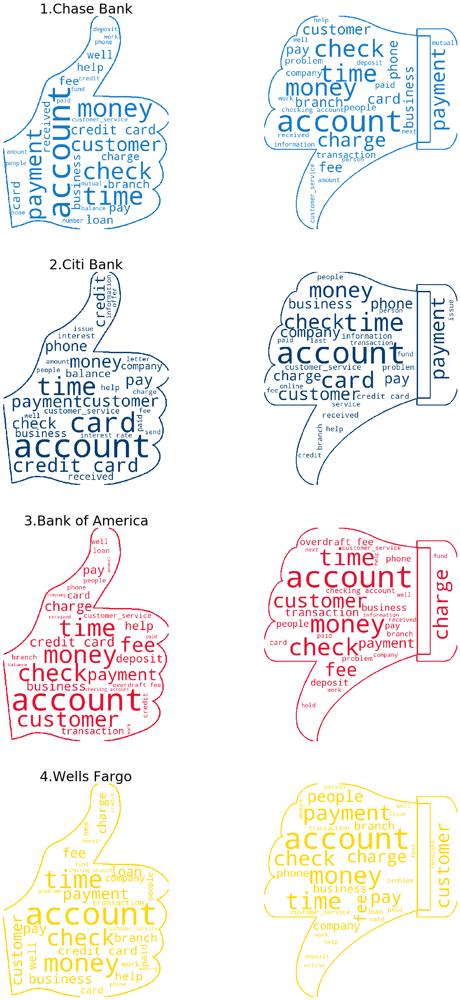

In [44]:
# all the generated word clouds for positive and negative wordclouds in one figure
fig=plt.figure(figsize=(20,40))
ax1 = fig.add_subplot(4,2,1)
ax1.imshow(chase_wcp)
plt.title('1.Chase Bank',fontsize= 30)
plt.axis("off")
ax2 = fig.add_subplot(4,2,2)
ax2.imshow(chase_wcn)
plt.axis("off")
ax3 = fig.add_subplot(4,2,3)
ax3.imshow(citi_wcp)
plt.title('2.Citi Bank',fontsize= 30)
plt.axis("off")
ax4 = fig.add_subplot(4,2,4)
ax4.imshow(citi_wcn)
plt.axis("off")
ax5 = fig.add_subplot(4,2,5)
ax5.imshow(bof_wcp)
plt.title('3.Bank of America',fontsize= 30)
plt.axis("off")
ax6 = fig.add_subplot(4,2,6)
ax6.imshow(bof_wcn)
plt.axis("off")
ax7 = fig.add_subplot(4,2,7)
ax7.imshow(wf_wcp)
plt.title('4.Wells Fargo',fontsize= 30)
plt.axis("off")
ax8 = fig.add_subplot(4,2,8)
ax8.imshow(wf_wcn)
plt.axis("off")

### 8.2 Top 20 words in positive reviews 

The most common 20 words in positive reviews filtered out from the vaderSentiment package for each bank with its frequency were extracted to a dataframe "positive_20" as follows.

In [45]:
# clean and lemmatize positive reviews using CleanText function for each bank 
chase_ptexts=CleanTxt(chase_pos_list)
citi_ptexts=CleanTxt(citi_pos_list)
bof_ptexts=CleanTxt(bof_pos_list)
wf_ptexts=CleanTxt(wf_pos_list)


#remove extra brackets from reviews
chase_ptokens = [x for y in chase_ptexts for x in y]
citi_ptokens = [x for y in citi_ptexts for x in y]
bof_ptokens = [x for y in bof_ptexts for x in y]
wf_ptokens = [x for y in wf_ptexts for x in y]

# word frequency 
chase_pwordcounts= Counter(chase_ptokens).most_common(20)
citi_pwordcounts= Counter(citi_ptokens).most_common(20)
bof_pwordcounts= Counter(bof_ptokens).most_common(20)
wf_pwordcounts= Counter(wf_ptokens).most_common(20)

# store most common 20 words positive reviews in a data frame
positive_20 = pd.DataFrame(list(zip(chase_pwordcounts,citi_pwordcounts,bof_pwordcounts,wf_pwordcounts)),
                           columns=['Chase', 'Citi Bank','Bank of America','WellsFargo'])
positive_20

,Chase,Citi Bank,Bank of America,WellsFargo
0,"(account, 3174)","(account, 1825)","(account, 4378)","(account, 3738)"
1,"(credit, 1452)","(card, 1406)","(fee, 1718)","(money, 1594)"
2,"(money, 1175)","(credit, 1321)","(check, 1714)","(check, 1314)"
3,"(card, 1140)","(time, 652)","(money, 1673)","(time, 1276)"
4,"(check, 1130)","(payment, 647)","(card, 1404)","(fee, 1213)"
5,"(time, 1021)","(interest, 512)","(time, 1367)","(payment, 1208)"
6,"(payment, 890)","(money, 493)","(credit, 1319)","(credit, 1116)"
7,"(fee, 761)","(customer, 438)","(customer, 1020)","(card, 961)"
8,"(customer, 696)","(pay, 415)","(payment, 998)","(customer, 855)"
9,"(pay, 609)","(balance, 359)","(pay, 792)","(business, 743)"


### 8.3 Top 20 words in negative reviews 

The most common 20 words in negative reviews filtered out from the vaderSentiment package for each bank with its frequency were extracted to a dataframe "negative_20" as follows.

In [46]:
# clean and lemmatize negative reviews using CleanText function for each bank 
chase_ntexts=CleanTxt(chase_neg_list)
citi_ntexts=CleanTxt(citi_neg_list)
bof_ntexts=CleanTxt(bof_neg_list)
wf_ntexts=CleanTxt(wf_neg_list)


#remove extra brackets from reviews
chase_ntokens = [x for y in chase_ntexts for x in y]
citi_ntokens = [x for y in citi_ntexts for x in y]
bof_ntokens = [x for y in bof_ntexts for x in y]
wf_ntokens = [x for y in wf_ntexts for x in y]

# word frequency 
chase_nwordcounts= Counter(chase_ntokens).most_common(20)
citi_nwordcounts= Counter(citi_ntokens).most_common(20)
bof_nwordcounts= Counter(bof_ntokens).most_common(20)
wf_nwordcounts= Counter(wf_ntokens).most_common(20)

# store most common 20 words positive reviews in a data frame
negative_20 = pd.DataFrame(list(zip(chase_nwordcounts,citi_nwordcounts,bof_nwordcounts,wf_nwordcounts)),
                           columns=['Chase', 'Citi Bank','Bank of America','WellsFargo'])
negative_20

,Chase,Citi Bank,Bank of America,WellsFargo
0,"(account, 6408)","(account, 2731)","(account, 9055)","(account, 4010)"
1,"(money, 2992)","(card, 1425)","(money, 3982)","(money, 1929)"
2,"(check, 2587)","(time, 978)","(check, 3627)","(payment, 1414)"
3,"(time, 1815)","(money, 831)","(fee, 3570)","(check, 1384)"
4,"(fee, 1661)","(check, 691)","(time, 2564)","(time, 1382)"
5,"(payment, 1592)","(payment, 662)","(charge, 2080)","(fee, 1245)"
6,"(card, 1388)","(credit, 637)","(payment, 1813)","(pay, 840)"
7,"(charge, 1304)","(customer, 547)","(card, 1691)","(card, 770)"
8,"(pay, 1165)","(pay, 502)","(overdraft, 1644)","(charge, 752)"
9,"(customer, 975)","(phone, 483)","(customer, 1597)","(customer, 747)"


Positive wordclouds and word frequency data for Chase bank show "loan" and "home" with higher weight. This indicates that the home mortgage loan program of Chase bank is popular among customers. However, "loan" appears in positive wordclouds/wordfrequency distribution of Bank of America and Wells Fargo indicating that they have popular loan programs as well. High-frequency negative words for Chase bank contain "checking account'', "transaction". On the other hand, these two words appear in positive wordclouds of Bank of America and Wells Fargo making them great competitors for Chase in these areas.Chase is one of the banks which provides customer assistant 24/7 via phone. That must be a reason the word "Phone" appears in positive and negative word clouds unlike "Wells Fargo" and "Bank of America".Citibank positive wordcloud has "interest rate" and "interest" unlike any other banks' positive wordclouds implying that Citibank has a favorable interest rate for customers. The word "overdraft fee" appears in Bank of America's positive and negative word clouds, unlike any other bank. This tells that, overdraft fee of Bank of America gets mixed reviews from customers and worth studying deeper.

## Section 9: Topic Modeling (All banks)

It is important to analyze the reviews and categorize them to understand customer expectations. Here, probabilistic topic modeling (popular unsupervised machine learning technique for topic discovery from large texts), were applied to all reviews from four banks to separate them into different categories.

This topic model based on the Latent Dirichlet Allocation (LDA) algorithm.

In [47]:
# Get Models for LDA
from gensim.models.coherencemodel import CoherenceModel
from gensim.models.wrappers import LdaVowpalWabbit, LdaMallet

In [48]:
# get all reviews(13216) to a list
all_reviews=list(chase_VS['review'])+list(citi_VS['review'])+list(bof_VS['review'])+list(wf_VS['review']) 
# clean them using CleanTxt function. 
# it clean, tokenize, make bigrams, remove stopwords, remove corpus specific common words, lemmatize and remove short words.
all_texts=CleanTxt(all_reviews)

In [49]:
# Create a dictionary representation of the documents.
dictionary = Dictionary(all_texts)
# remove most frequent 20 words 
dictionary.filter_n_most_frequent(10) 
# removes all tokens in the dictionary that are less frequent than 2 documents and more frequent than 50% documents.
dictionary.filter_extremes(no_below=2, no_above=0.5, keep_n=None)
print(len(dictionary))

12429


In [50]:
corpus = [dictionary.doc2bow(text) for text in all_texts]

### 9.1 The Optimal Number of Topics for LDA

This code takes longer to execute. Therefore it is in Raw NBconvert format and output is embeded as an image.

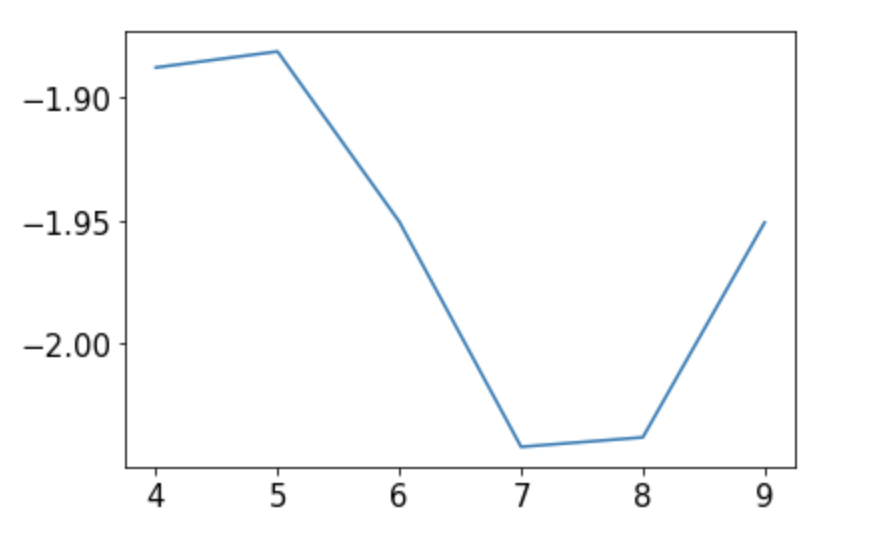

In [51]:
from IPython.display import Image
Image("Optimal_k.png",width = 600, height = 300)

According to the above graph there are 5 topics can be identified based on all reviews.

In [52]:
# build a LDA topic model with 5 topics
np.random.seed(1) # setting random seed to get the same results each time. 
model = ldamodel.LdaModel(corpus, id2word=dictionary, num_topics=5, passes=50)                             

### 9.2 Visualize the Topics-Keywords

In [53]:
import pyLDAvis.gensim
pyLDAvis.enable_notebook()
pyLDAvis.gensim.prepare(model, corpus, dictionary, sort_topics=False)

PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
0     -0.025410 -0.004298       1        1  25.915676
1      0.190489  0.048742       2        1  18.851229
2     -0.116866 -0.153529       3        1  14.818181
3      0.070268 -0.076355       4        1  19.165321
4     -0.118481  0.185440       5        1  21.249599, topic_info=          Term         Freq        Total Category  logprob  loglift
129    payment  9519.000000  9519.000000  Default  30.0000  30.0000
78      charge  6457.000000  6457.000000  Default  29.0000  29.0000
420  overdraft  4334.000000  4334.000000  Default  28.0000  28.0000
965       loan  3858.000000  3858.000000  Default  27.0000  27.0000
833    charged  3447.000000  3447.000000  Default  26.0000  26.0000
..         ...          ...          ...      ...      ...      ...
296    problem   972.891602  3204.516113   Topic5  -5.3493   0.3568
591      close   900.774292  2676.386719   Topic5  -5.4263   0.4599
848     trying   744.558655  1937.037109   Topic5  -5.6168   0.5927
265    nothing   770.062256  2611.114502   Topic5  -5.5831   0.3278
500  something   690.645081  1556.056152   Topic5  -5.6919   0.7365

[398 rows x 6 columns], token_table=      Topic      Freq    Term
term                         
138       1  0.753633  access
138       3  0.194486  access
138       4  0.036098  access
138       5  0.015470  access
2999      5  0.984893   accts
...     ...       ...     ...
1627      3  0.003270   world
1627      5  0.925304   world
512       1  0.163375   worst
512       5  0.836440   worst
2181      5  0.996189   youre

[789 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[1, 2, 3, 4, 5])

In pyLDAvis’s output, each circle represents a topic and the larger the circle, the more prevalent is that topic. Here Topic-1 is more prevalent than others.

### 9.3 Word Clouds of Top 10 Keywords in Each Topic

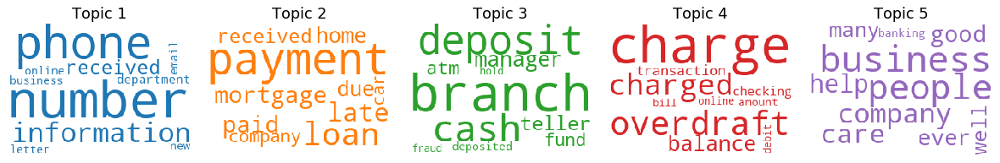

In [54]:
# Wordcloud of Top 10 words in each topic
from matplotlib import pyplot as plt
from wordcloud import WordCloud, STOPWORDS
import matplotlib.colors as mcolors

cols = [color for name, color in mcolors.TABLEAU_COLORS.items()] 

cloud = WordCloud(max_words=10,
                  background_color='white',
                  width=250,height=180,
                  colormap='tab10',color_func=lambda *args, **kwargs: cols[i])

topics = model.show_topics(formatted=False)

fig, axes = plt.subplots(1, 5, figsize=(15,10), sharex=True, sharey=True ,dpi=80)

for i, ax in enumerate(axes.flatten()):
    fig.add_subplot(ax)
    topic_words = dict(topics[i][1])
    cloud.generate_from_frequencies(topic_words, max_font_size=300)
    plt.gca().imshow(cloud)
    plt.gca().set_title('Topic ' + str(i+1), fontdict=dict(size=16))
    plt.gca().axis('off')


plt.subplots_adjust(wspace=0, hspace=0)
plt.axis('off')
plt.margins(x=0, y=0)
plt.tight_layout()
plt.show()

### 9.4 Word Counts of Topic Keywords

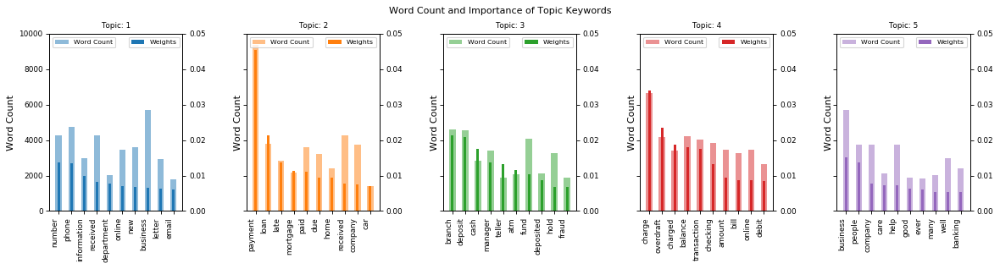

In [55]:
topics = model.show_topics(formatted=False)
data_flat = [w for w_list in all_texts for w in w_list]
counter = Counter(data_flat)

out = []
for i, topic in topics:
    for word, weight in topic:
        out.append([word, i , weight, counter[word]])

df = pd.DataFrame(out, columns=['word', 'topic_id', 'importance', 'word_count'])        

# Plot Word Count and Weights of Topic Keywords
fig, axes = plt.subplots(1, 5, figsize=(15,4), sharey=True, dpi=80)
cols = [color for name, color in mcolors.TABLEAU_COLORS.items()]
for i, ax in enumerate(axes.flatten()):
    ax.bar(x='word', height="word_count", data=df.loc[df.topic_id==i, :], 
           color=cols[i], width=0.5, alpha=0.5, label='Word Count')
    ax_twin = ax.twinx()
    ax_twin.bar(x='word', height="importance", data=df.loc[df.topic_id==i, :], 
                color=cols[i], width=0.2, label='Weights')
    ax.set_ylabel('Word Count',fontsize=10)
    ax_twin.set_ylim(0, 0.05); ax.set_ylim(0, 10000)
    ax_twin.tick_params(labelsize = 8), ax.tick_params(labelsize = 8)
    ax.set_title('Topic: ' + str(i+1),fontsize=8)
    ax.set_xticklabels(df.loc[df.topic_id==i, 'word'], rotation=90, horizontalalignment= 'right',fontsize=8)
    ax.legend(loc='upper left',fontsize=7),ax_twin.legend(loc='upper right',fontsize=7)

fig.tight_layout(w_pad=2)    
fig.suptitle('Word Count and Importance of Topic Keywords', fontsize=10, y=1)    
plt.show()

### 9.4 The Most Representative Document for Each Topic 

In [56]:
#Display setting to show more characters in column
#pd.set_option('display.max_colwidth', None)

# make a dataframe
Topicsdf = pd.DataFrame()

for i, row_list in enumerate(model[corpus]):
    row = row_list[0] if model.per_word_topics else row_list 
    # sort by contribution
    row = sorted(row, key=lambda x: (x[1]), reverse=True)
    # Get the Dominant topic, Contribution and Keywords for each document
    for j, (topic_number,proportion) in enumerate(row):
            if j == 0:  # this is the dominant topic as we already sorted
                wp = model.show_topic(topic_number,20) # get 20 keywords
                keywords = ", ".join([word[0] for word in wp]) # join keywords with comma
                # append Dominant topic, proportion and keywords to dataframe
                Topicsdf = Topicsdf.append(pd.Series([int(topic_number)+1, round(proportion,4), keywords]), ignore_index=True)
            else:
                break
# get all the documnets
contents = pd.Series(all_texts)
# concaternate documents to dataframe
Topicsdf=pd.concat([Topicsdf, contents], axis=1)
# rename columns
Topicsdf.columns = ['Dominant_Topic','Contribution', 'Keywords','Document']
Topicsdf.head()


,Dominant_Topic,Contribution,Keywords,Document
0,5.0,0.6158,"business, people, company, care, help, good, e...","[amount, value, provides, company, las_vegas, ..."
1,1.0,0.4936,"number, phone, information, received, departme...","[past, large, canadian, owned, chain, exemplif..."
2,4.0,0.3494,"charge, overdraft, charged, balance, transacti...","[people, easy, difficult, time, able, suspend,..."
3,5.0,0.8750,"business, people, company, care, help, good, e...","[customer, well, customer, throughout, experie..."
4,3.0,0.7892,"branch, deposit, cash, manager, teller, atm, f...","[came, town, st_louis, park, minnesota, appoin..."


In [57]:
# make a dataframe
dominant_topic_df = pd.DataFrame()
# groupby documnets in Topicdf by 'Dominant_Topic'
topicsgrpd = Topicsdf.groupby('Dominant_Topic')

# sort the documnets by contribution and get the one with highest score 
for i, grp in topicsgrpd:
    dominant_topic_df = pd.concat([dominant_topic_df, grp.sort_values(['Contribution'], ascending=False).head(1)],axis=0)

dominant_topic_df

,Dominant_Topic,Contribution,Keywords,Document
4039,1.0,0.9959,"number, phone, information, received, departme...","[new, credit, card, serviced, absolute_worst, ..."
2602,2.0,0.9917,"payment, loan, late, mortgage, paid, due, home...","[started, feb, house, vista, remodeled, paymen..."
9549,3.0,0.9969,"branch, deposit, cash, manager, teller, atm, f...","[sat, nov, payroll, check, cash, payroll, chec..."
12061,4.0,0.9949,"charge, overdraft, charged, balance, transacti...","[lodge, formal_complaint, practice, following,..."
321,5.0,0.9877,"business, people, company, care, help, good, e...","[intelligent, person, care, much, hard_earned,..."


From the LDA model 5 different topics can be identified to segment all the reviews based on word counts and weights. 
They are,

**Topic-1 : Communication**

The most prominant keywords are number, phone, information, received, department, online, new, business, letter, email

**Topic-2 : : Home mortgage and car loans**

The most prominant keywords are payment, loan, late, mortgage, paid, due, home, received, company, car, letter, interest, amount, house

**Topic-3 : Onsite Banking**

The most prominant keywords are branch, deposit, cash, manager, teller, atm, fund, deposited, hold, fraud, name, took, claim

**Topic-4 : Charges**

The most prominant keywords are charge, overdraft, charged, balance, transaction, checking, amount, bill, online, debit

**Topic-5 : Customer Service**  

The most prominant keywords are business, people, company, care, help, good, ever, many, well, banking, work, problem, think


### 9.5 Topic Profile for Chase Bank Reviews

In [58]:
# get chase bank reviews
ChaseTopicsdf=Topicsdf.head(3652)
ChaseTopicsdf.head()

,Dominant_Topic,Contribution,Keywords,Document
0,5.0,0.6158,"business, people, company, care, help, good, e...","[amount, value, provides, company, las_vegas, ..."
1,1.0,0.4936,"number, phone, information, received, departme...","[past, large, canadian, owned, chain, exemplif..."
2,4.0,0.3494,"charge, overdraft, charged, balance, transacti...","[people, easy, difficult, time, able, suspend,..."
3,5.0,0.8750,"business, people, company, care, help, good, e...","[customer, well, customer, throughout, experie..."
4,3.0,0.7892,"branch, deposit, cash, manager, teller, atm, f...","[came, town, st_louis, park, minnesota, appoin..."


In [59]:
# number of documents for each topic in Chase dataset
ChaseTP=ChaseTopicsdf.groupby('Dominant_Topic')[['Document']].count()
ChaseTP

,Document
Dominant_Topic,
1.0,880
2.0,756
3.0,563
4.0,709
5.0,744


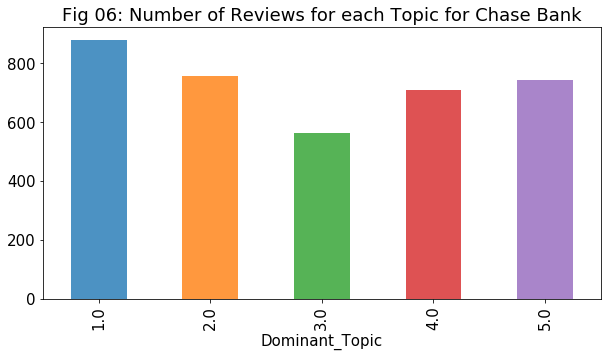

In [60]:
ChaseTP.plot(kind='bar',y='Document',stacked=False,figsize=(10,5), alpha=0.8,
             color=[cols[0],cols[1],cols[2],cols[3],cols[4]],legend=False,
            title="Fig 06: Number of Reviews for each Topic for Chase Bank")

Topic-1 : Communication

Topic-2 : Home mortgage and car loans

Topic-3 : Onsite Banking

Topic-4 : Charges

Topic-5 : Customer Service    

According to the above bar chart Topic-1 which was identified as "Communication" contains the highest number of reviews of Chase Bank. Topic-2 (Home/mortgage/car loans) and Topic-5(Customer Service) comes next. The least reviewed topic for Chase Bank is  Topic-3 (Onsite Banking)

### 9.6 Topic Profile for Negative and Positive Reviews of Chase Bank

It is worth investigating the topic profile for negative and positive reviews to identify topics that need to be improved and topics that has acclaimed by customers.

In [61]:
# add VaderSentiment score and sentiment(from chase_sentiment dataframe) to the ChaseTopicsdf dataframe
ChaseTopics_sentiment = ChaseTopicsdf.merge(chase_sentiment.loc[:,['VSscore','sentiment']], how='outer', left_index=True, right_index=True)
ChaseTopics_sentiment.head()

,Dominant_Topic,Contribution,Keywords,Document,VSscore,sentiment
0,5.0,0.6158,"business, people, company, care, help, good, e...","[amount, value, provides, company, las_vegas, ...",0.9437,positive
1,1.0,0.4936,"number, phone, information, received, departme...","[past, large, canadian, owned, chain, exemplif...",0.7845,positive
2,4.0,0.3494,"charge, overdraft, charged, balance, transacti...","[people, easy, difficult, time, able, suspend,...",-0.5399,negative
3,5.0,0.8750,"business, people, company, care, help, good, e...","[customer, well, customer, throughout, experie...",0.9901,positive
4,3.0,0.7892,"branch, deposit, cash, manager, teller, atm, f...","[came, town, st_louis, park, minnesota, appoin...",0.2484,positive


In [62]:
# get all negative reviews to different dataframe
topics_n=ChaseTopics_sentiment.loc[ChaseTopics_sentiment['sentiment'] == 'negative'].sort_values(ascending=True,by='VSscore')
# negative review count for each topic
topics_ncount=topics_n.groupby('Dominant_Topic')[['Document']].count()

# get all positive reviews to different dataframe
topics_p=ChaseTopics_sentiment.loc[ChaseTopics_sentiment['sentiment'] == 'positive'].sort_values(ascending=False,by='VSscore')
# positive review count for each topic
topics_pcount=topics_p.groupby('Dominant_Topic')[['Document']].count()

# merge positive and negative counts to topic
topic_npcount=topics_ncount.merge(topics_pcount,on='Dominant_Topic')
topic_npcount=topic_npcount.rename(columns={'Document_x':'negative reviews','Document_y':'positive reviews'})
topic_npcount

,negative reviews,positive reviews
Dominant_Topic,,
1.0,573,293
2.0,401,332
3.0,379,174
4.0,486,207
5.0,422,314


In [63]:
# calculate percentage
topic_np_percetage=topic_npcount.div(topic_npcount.sum(axis=0), axis=1).mul(100).round(2)
topic_np_percetage

,negative reviews,positive reviews
Dominant_Topic,,
1.0,25.34,22.20
2.0,17.74,25.15
3.0,16.76,13.18
4.0,21.49,15.68
5.0,18.66,23.79


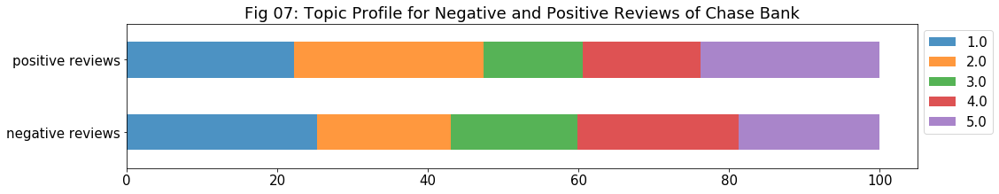

In [64]:
# plot the results in a bar chart
ax3=topic_np_percetage.T.plot.barh(stacked=True,figsize=(16,3), alpha=0.8,
                                  title='Fig 07: Topic Profile for Negative and Positive Reviews of Chase Bank')
ax3.legend(bbox_to_anchor=(1,1))

Topic-1 : Communication

Topic-2 : Home/mortgage/car loans

Topic-3 : Onsite Banking

Topic-4 : Charges

Topic-5 : Customer Service    

According to the above graph Topic-1(Communication) and Topic-4(Charges) have higher percentages of negative reviews compared to positive reviews. Moreover, they are the top two contributors to negative reviews.

On the other hand, Topic-2(Home mortgage and car loans) and Topic-5(Customer Service) have higher percentages of positive reviews compared to negative reviews and comes top two in contributing to positive reviews as well.

## Section 10 : Semantic Network Analysis for Chase Bank

### 10.1 Semantic Network for all Chase Reviews

Semantic networks for Chase reviews were created for the most common 1000 bigrams using Gephi software.

In [65]:
#Create list of lists containing bigrams in all chase bank reviews 

terms_bigram = [list(bigrams(i)) for i in CleanTxt(list(chase_VS['review']))]
Bigrams = list(itertools.chain(*terms_bigram))

# Create counter of words in clean bigrams and print top 10
bigram_counts = collections.Counter(Bigrams)
bigram_counts.most_common(10)

[(('credit', 'card'), 853),
 (('checking', 'account'), 755),
 (('overdraft', 'fee'), 483),
 (('close', 'account'), 454),
 (('money', 'account'), 391),
 (('account', 'closed'), 346),
 (('saving', 'account'), 305),
 (('closed', 'account'), 269),
 (('closing', 'account'), 243),
 (('late', 'fee'), 220)]

In [ ]:
# Print out network of words into CSV File
outfile = open("word_network1000.csv", "w", newline='')
w = csv.writer(outfile)
for i in bigram_counts.most_common(1000):
    w.writerow([i[0][0], i[0][1], i[1]])  
outfile.close()

The following is the statistical analysis report created using Gephi software.

In [66]:
Chase_SNA=pd.read_csv("SNA.csv")
Chase_SNA.head()

,Id,Label,timeset,indegree,outdegree,Degree,Eccentricity,closnesscentrality,harmonicclosnesscentrality,betweenesscentrality,modularity_class
0,credit,credit,NaN,20,11,31,5,0.432790,0.475686,5923.010634,0
1,card,card,NaN,17,21,38,5,0.428860,0.473137,3728.847417,0
2,checking,checking,NaN,12,2,14,5,0.392428,0.424510,525.421215,5
3,account,account,NaN,90,138,228,5,0.591922,0.686745,52935.417606,5
4,overdraft,overdraft,NaN,6,3,9,6,0.385662,0.413412,19.249206,3


### Degree

Degree is number of edges attached to a node.

In [67]:
Chase_SNA=pd.read_csv("SNA.csv")
Chase_SNA_degree=Chase_SNA[["Label","Degree"]]
Chase_SNA_degree.sort_values(ascending=False,by=['Degree']).head(10)

,Label,Degree
3,account,228
19,check,89
7,money,84
54,time,52
21,payment,44
5,fee,38
1,card,38
16,pay,35
0,credit,31
40,charge,28


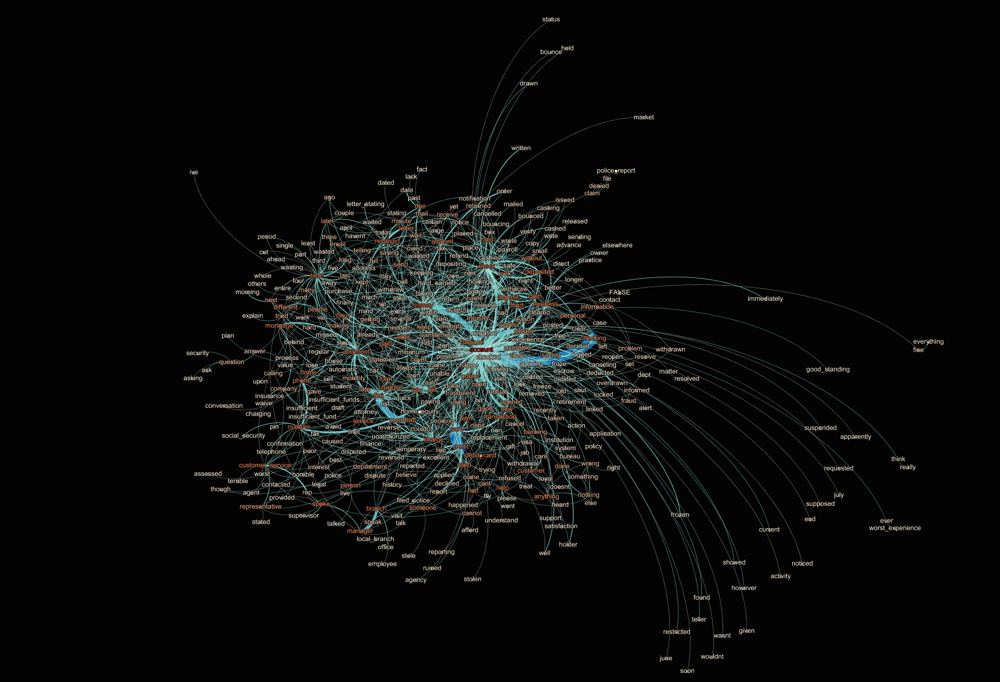

In [68]:
Image("degree.png",width = 800, height = 400,)

**"account", "check" and "money"** have highest degrees in Chase  Semantic network. This tells that account , check and money are the most popular words.

### Betweenness Centrality

Betweenness centrality is a measure of how often given node lies on the shortest path between two other nodes. Nodes in the shortest path have higher BC and they are important in terms of communication. 

In [69]:
Chase_SNA_betweenness=Chase_SNA[["Label","betweenesscentrality"]]
Chase_SNA_betweenness.sort_values(ascending=False,by=['betweenesscentrality']).head(10)

,Label,betweenesscentrality
3,account,52935.417606
19,check,12479.773614
7,money,11843.648648
54,time,9442.348229
21,payment,6138.845664
0,credit,5923.010634
5,fee,5762.582621
1,card,3728.847417
20,business,3674.935954
25,received,3652.135748


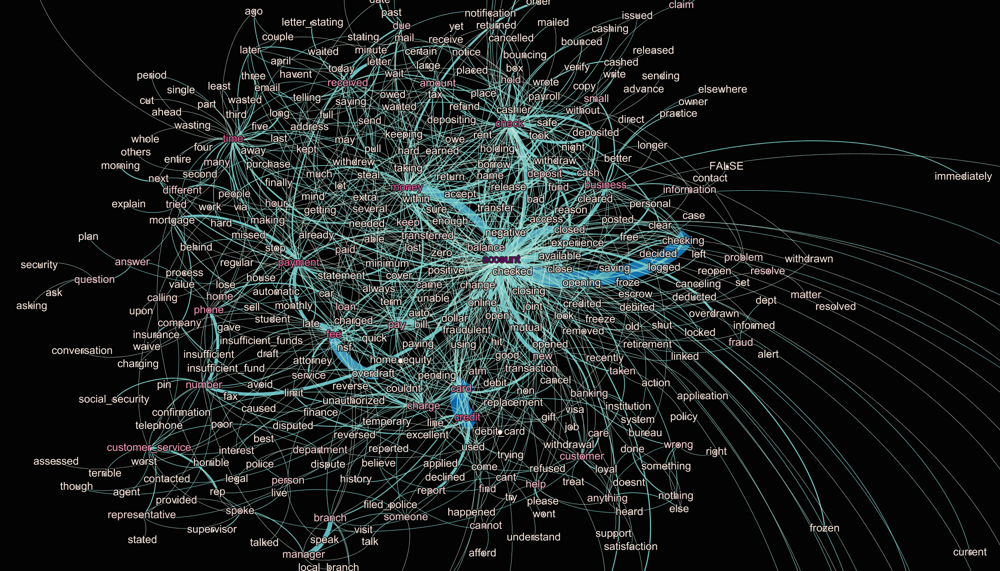

In [70]:
Image("betweenness1.png",width = 800, height = 400,)

In Chase Semantic network the top three words in terms of betweenness centrality are **"account", "check" and "money"**. This tells that account , check and money are the words that mostly used in connecting other words in reviews.

### Closeness Centrality 

closeness centrality is the average length of all shortest distance from one node to every other nodes in the network.

In [71]:
Chase_SNA_closeness=Chase_SNA[["Label","closnesscentrality"]]
Chase_SNA_closeness.sort_values(ascending=False,by=['closnesscentrality']).head(10)

,Label,closnesscentrality
141,short,1.000000
438,morgan,1.000000
108,explained,1.000000
437,j_p,1.000000
213,class_action,1.000000
109,situation,1.000000
140,long_story,1.000000
180,rate,0.800000
214,lawsuit,0.666667
409,higher,0.666667


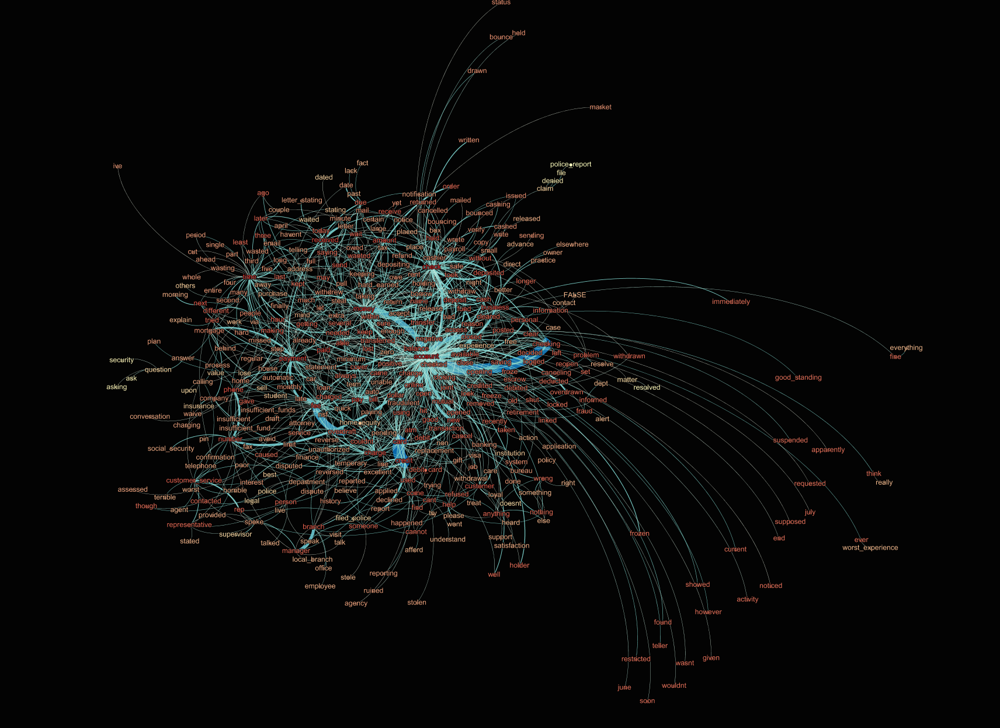

In [72]:
Image("closeness.png",width = 800, height = 400,)

The closeness centrality is high (1.0 ) for some words in this network. Those are the ones stand alone in the network. In the connected network, "rate", "lawsuit" and "higher" has highest closeness centrality.

### Modularity

18 clusters were identified for words in Chase_SNA.csv and displayed below in different colors.

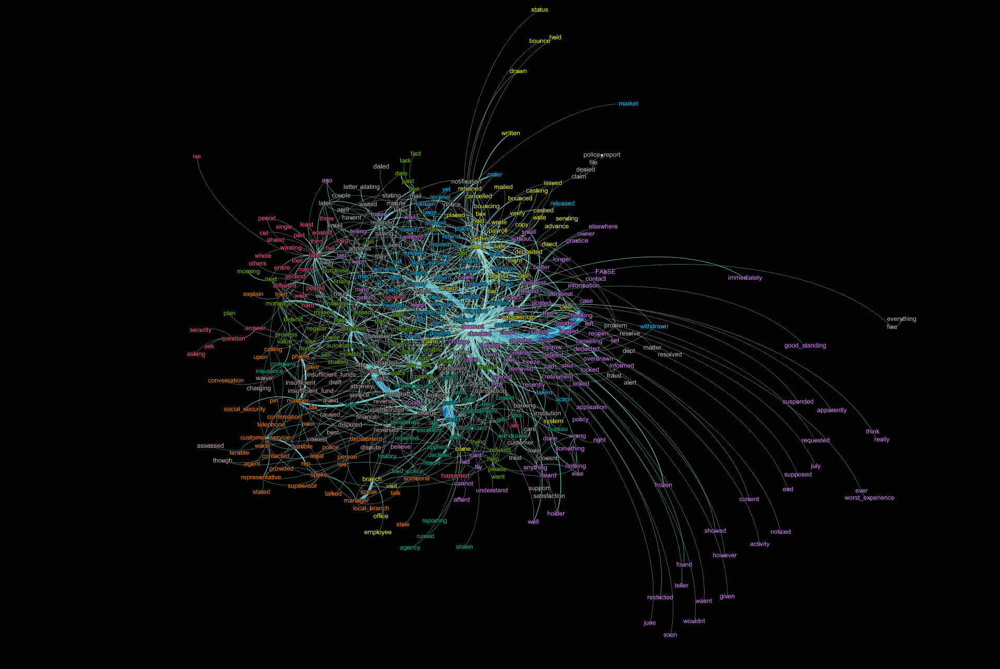

In [73]:
Image("modularity.png",width = 800, height = 400,)

### 10.2 Semantic Network for Positive Reviews

Semantic network for Chase positive reviews was created using the most common 200 bigrams in Chase banks' positive reviews

In [74]:
#Create list of lists containing bigrams in chase positive reviews 
pterms_bigram = [list(bigrams(i)) for i in chase_ptexts]
pBigrams = list(itertools.chain(*pterms_bigram))

# Create counter of words in clean bigrams in positive reviews and print top 10
pbigram_counts = collections.Counter(pBigrams)
pbigram_counts.most_common(10)

[(('credit', 'card'), 516),
 (('checking', 'account'), 231),
 (('close', 'account'), 149),
 (('account', 'closed'), 122),
 (('credit', 'score'), 104),
 (('money', 'account'), 93),
 (('closing', 'account'), 90),
 (('saving', 'account'), 88),
 (('open', 'account'), 84),
 (('closed', 'account'), 79)]

In [ ]:
# Print out network of words into CSV File
p_outfile = open("word_pnetwork200.csv", "w", newline='')
w = csv.writer(p_outfile)
for i in pbigram_counts.most_common(200):
    w.writerow([i[0][0], i[0][1], i[1]])  
p_outfile.close()

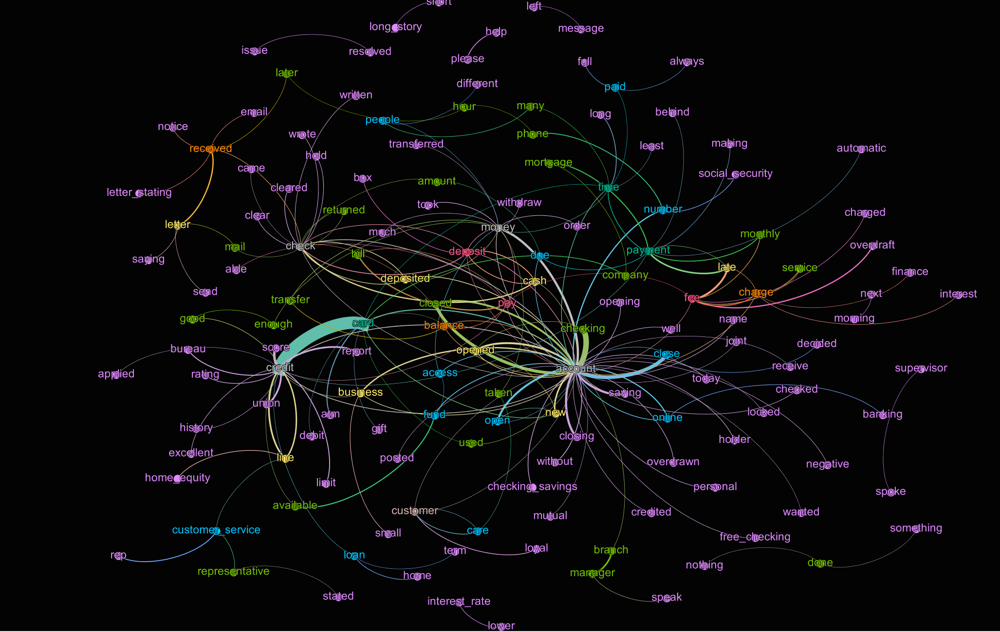

In [75]:
Image("positive.png",width = 800, height = 400,)

This shows the semantic network for most common 200 words in positive reviews of Chase Bank. Words are color coded according to the degree and highes degree words appear in gray. Edge thickness indicates the weight.

money, account, credit, check are the highest degree words. Credit-Card seems appear more frequently as the edge weight is significantely high.

### 10.3 Semantic Network for Negative Reviews

Semantic network for Chase negative reviews was created using the most common 200 bigrams in Chase banks' negative reviews

In [76]:
#Create list of lists containing bigrams in chase negative reviews 
nterms_bigram = [list(bigrams(i)) for i in chase_ntexts]
nBigrams = list(itertools.chain(*nterms_bigram))

# Create counter of words in clean bigrams in negative reviews and print top 10
nbigram_counts = collections.Counter(nBigrams)
nbigram_counts.most_common(10)

[(('checking', 'account'), 503),
 (('overdraft', 'fee'), 339),
 (('close', 'account'), 301),
 (('money', 'account'), 297),
 (('credit', 'card'), 267),
 (('account', 'closed'), 221),
 (('closed', 'account'), 190),
 (('saving', 'account'), 188),
 (('closing', 'account'), 153),
 (('pay', 'bill'), 149)]

In [ ]:
# Print out network of words into CSV File
n_outfile = open("word_nnetwork200.csv", "w", newline='')
w = csv.writer(n_outfile)
for i in nbigram_counts.most_common(200):
    w.writerow([i[0][0], i[0][1], i[1]])  
n_outfile.close()

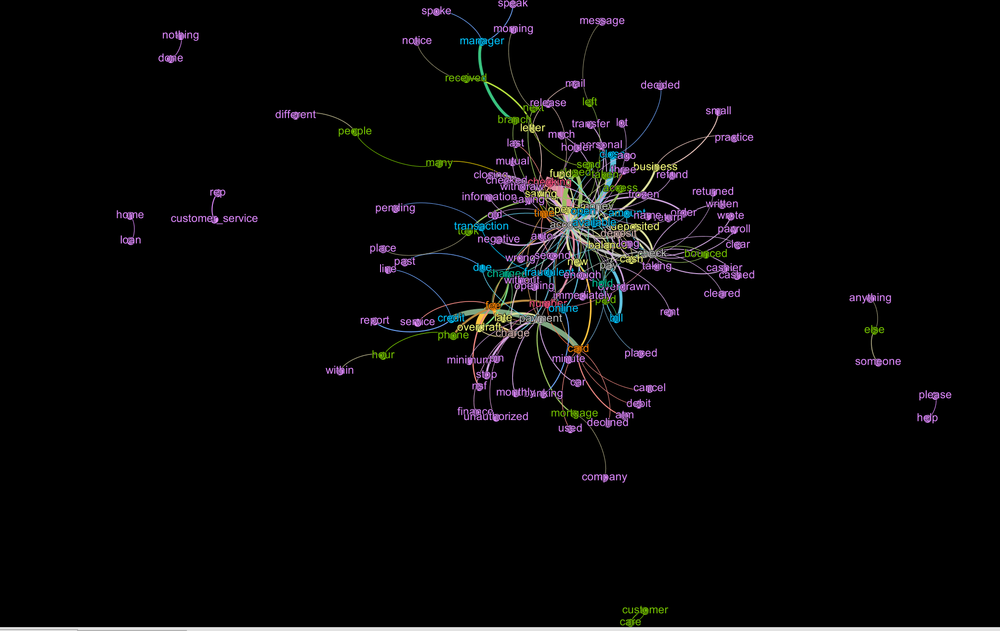

In [77]:
Image("negative.png",width = 800, height = 400,)

This shows the semantic network for most common 200 words in negative reviews of Chase Bank. Just as ain the positive review network highest degree words appear in gray and edge thickness indicates the weight.

money, account, pay, payment and check are the highest degree words. checking-account, close-account and overdraft-fee seem appear more frequently as the edge weight for those bigrams are significantely high.

## Section 11: Results and Discussion

#### Customers of Chase Bank:  

Based on state and city of customers who shared their experience on consumeraffairs.com, chase customers are mostly from West, South, and East-North Central regions. The majority of customers for other banks are from West, South, and East. It can be clearly seen that Chase Bank is not so popular in the east as Bank of America, Wells Fargo, and CitiBank. However, Chase bank maintains its popularity in the East-North Central region. Chase Bank can focus on expanding and developing strategies to attract customers in the east region in order to sustain its business there.

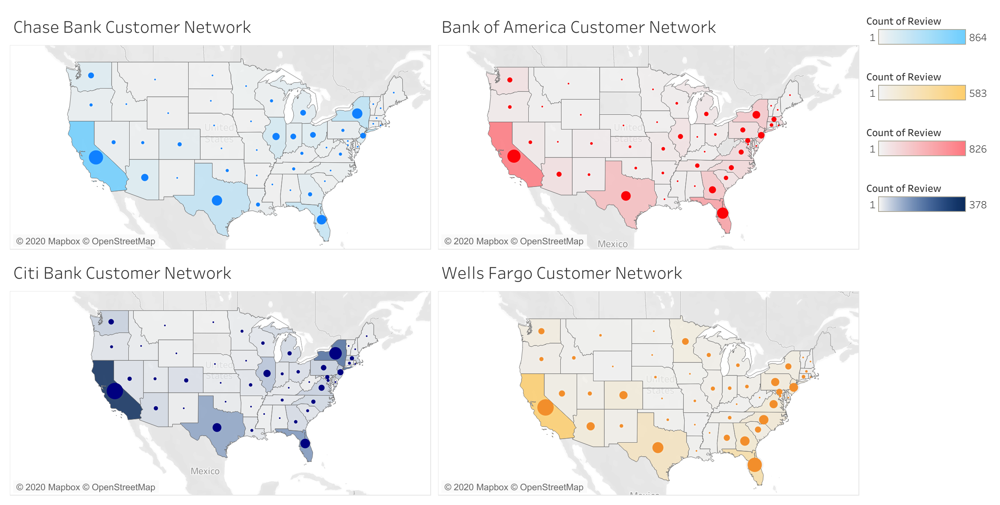

In [78]:
# created using Tableau software
Image("Dashboard 1.png",width = 1000, height = 500)

The following figure shows the Rating distribution for Chase bank. This helps to identify the states where customers are satisfied and not satisfied by studying the rating profile for each state. Indiana has low customer satisfaction compared to other states in the East-North Central region and Kentucky, Kansas, Arkansas, New Jersey, Tennessee, and New Hampshire have high customer satisfaction compared to other states.

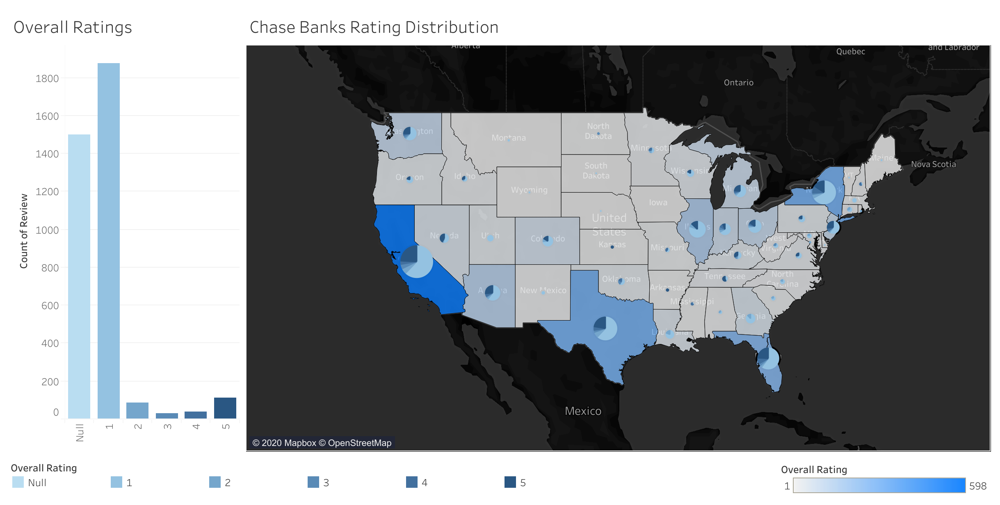

In [79]:
# created using Tableau software
Image("Dashboard 2.png",width = 1000, height = 500,)

According to Fig 05, All the banks studied in this project get their highest percentage of negative reviews from the state of California, and among those highest percentage is for Chase Bank (14.68%). Moreover, state of California produces the highest percentage of positive reviews for Chase Bank, Citi Bank and Wells Fargo as well. Bank of America seems popular in the state of Florida as it produces the highest percentage of positive reviews for Bank of America.

#### Strengths and Weaknesses of Chase Bank

"Phone" appears in positive and negative wordclouds of Chase Bank unlike "Wells Fargo" and  "Bank  of America". That may be due to its 24/7 customer service via phone and it can be identified as one of the great strengths of Chase Bank.

From the topic model developed using LDA, 5 different topics were identified, and according to Fig 07, Topic-2(Home mortgage and car loans) and Topic-5(Customer Service) gets the most positive reviews. Positive wordclouds and word frequency data for Chase bank also show "loan" and "home" with higher weight. That indicates customers are satisfied with products and services offered relating to Loans and Customer Service.  The least reviewed topic for Chase Bank is  Topic-3 (Onsite Banking) (Fig 06)

On the other hand, Topic-1(Communication) and Topic-4(Charges) are the topics that get the most negative reviews for Chase Bank. In addition, Fig 06 shows that the highest number of reviews of Chase Bank comes from Topic-1(Communication) as well. The management of Chase bank can closely study those areas and improvements can be made to increase customer satisfaction.

#### Competitors of Chase Bank

Time series analysis (Fig 02) shows that the Chase Bank gained its most 5-star ratings during the period of 2010 - 2011. During that time Citi Bank and Bank of America were less popular and Chase Bank's competitor was Wells Fargo. However, after 2014 the Bank of America has started to gain popularity.

According to mean yearly ratings (Fig 03) Chase bank has a high reputation in 2010 and after a series of fluctuations it has able to maintain its yearly mean rating at 1.71 in 2020. Both, Bank of America and Wells Fargo have higher yearly mean ratings compared to Chase bank at the end of 2020, and Bank of America has the highest. Bank of America had the lowest yearly mean rating in 2010 and it seems gaining up popularity over the years.

Bank of America has the highest percentage of positive reviews (64.17%). The second highest is for Chase bank which is 61.91%. Bank of America has the lowest percentage of negative reviews (34.7%) and like above Chase Bank comes next with 36.14%. The neutral review percentage for Chase bank is higher than that of Bank of America. (Fig 04)

High-frequency negative words for Chase bank contain "checking account" and "transaction". "checking-account" appears with high weight in Chase Bank's negative review semantic network as well. On the other hand these two words: "checking account" and "transaction" appear in positive wordclouds of Bank of America and Wells Fargo making them great competitors for Chase in these areas.

Chase banks negative review semantic network shows high weight for bigram "overdraft fee". However, It appears in Bank of America's positive and negative word clouds, unlike any other bank. This tells that, overdraft fee of Bank of America gets mixed reviews from customers and worth studying deeper.

Citibank positive wordcloud has "interest rate" and  "interest" unlike any other banks' positive wordclouds implying that Citibank has a favorable interest rate for customers. 

Considering all that, the Bank of America can be identified as the main competitor of Chase Bank. 

### Managerial Implications

It should be noted that customers, in general, are more likely to write a negative review based on a bad experience rather than to write a positive review based on a good experience on a website like www.consumeraffairs. Therefore, this data can be more biased to negative experiences. However, it is important to study reviews, especially the negative reviews in order to make changes to the areas where the customers are not satisfied. 

Excessive cleaning of corpus related words and better cleaning of common adjectives and adverbs would have improved the topic model as well as other analysis. 

Rather than analyzing just one website to identify customers and their needs, collecting data from many different sources like Twitter, would be more efficient and would help to take better decisions.

### Referances
    
Chase Bank reviews : https://www.consumeraffairs.com/finance/chase_bank.html?page=%s

Citibank reviews  : https://www.consumeraffairs.com/finance/citibank.htm?page=%s

Bank of America reviews : https://www.consumeraffairs.com/finance/bofa.html?page=%s

Wells Fargo reviews : https://www.consumeraffairs.com/finance/wells_fargo.html?page=%s   